# PREDICTING CUSTOMER LIFETIME VALUE

## Customer Lifetime value
Customer lifetime value (CLV) is a measure of the total income a business can expect to bring in from a typical customer for as long as that person or account remains a client. When measuring CLV, it's best to look at the total average revenue generated by a customer and the total average profit.

## Problem Statement
VahanBima is one of the leading insurance companies in India. It provides motor vehicle insurance at the best prices with 24/7 claim settlement. It offers different types of policies for both personal and commercial vehicles. It has established its brand across different regions in India.

Around 90% of businesses today use personalized services. The company wants to launch different personalized experience programs for customers of VahanBima. The personalized experience can be dedicated resources for claim settlement, different kinds of services at the doorstep, etc. In order to do so, they would like to segment the customers into different tiers based on their customer lifetime value (CLTV).

In order to do it, they would like to predict the customer lifetime value based on the activity and interaction of the customer with the platform. So, as a part of this challenge, your task at hand is to build a high-performance and interpretable machine learning model to predict the CLTV based on user and policy data.

## About the Dataset
You are provided with the sample dataset of the company holding the information of customers and policies such as the highest qualification of the user, total income earned by a customer in a year, employee status, policy opted by the user, type of policy and so on and the target variable indicating the total customer lifetime value.

- id-Unique identifier of a customer
- gender-Gender of the customer
- area-Area of the customer
- qualification-Highest Qualification of the customer
- income-Income earned in a year (in rupees)
- marital_status-Marital Status of the customer {0:Single, 1: Married}
- vintage-No. of years since the first policy date
- claim_amount-Total Amount Claimed by the customer (in rupees)
- num_policies-Total no. of policies issued by the customer
- policy-Active policy of the customer
- type_of_policy-Type of active policy
- cltv- Customer lifetime value (Target Variable)

Data Source: https://www.kaggle.com/datasets/shibumohapatra/customer-life-time-value?resource=download

In [1]:
#modules for supervised regression 
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,ExtraTreesRegressor,AdaBoostRegressor
import xgboost as xgb
from sklearn.linear_model import HuberRegressor

#modules for data analysis, transformation and model evaluation
from sklearn.model_selection import train_test_split,KFold,cross_val_score,GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder,RobustScaler,LabelEncoder,FunctionTransformer,PowerTransformer
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SelectKBest, chi2,f_regression
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from sklearn.model_selection import cross_val_score,cross_val_predict

#COLUMN TRANSFROMER
from sklearn.compose import ColumnTransformer

#DATA PREPROCESSING, VISUALIZATION, CLEANING, STATISTICS
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import scipy
import regex
import math 


In [3]:
train = pd.read_csv("/Users/USER/Documents/DATASETS/Customer_life_time_value/train_BRCpofr.csv")
train.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv
0,1,Male,Urban,Bachelor,5L-10L,1,5,5790,More than 1,A,Platinum,64308
1,2,Male,Rural,High School,5L-10L,0,8,5080,More than 1,A,Platinum,515400
2,3,Male,Urban,Bachelor,5L-10L,1,8,2599,More than 1,A,Platinum,64212
3,4,Female,Rural,High School,5L-10L,0,7,0,More than 1,A,Platinum,97920
4,5,Male,Urban,High School,More than 10L,1,6,3508,More than 1,A,Gold,59736


## SPLIT DATA

In [4]:
X_train,X_test=train_test_split(train,test_size=0.2,random_state=0)
X_train.shape,X_test.shape

((71513, 12), (17879, 12))

In [5]:
df=X_train.copy()

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71513 entries, 15493 to 68268
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              71513 non-null  int64 
 1   gender          71513 non-null  object
 2   area            71513 non-null  object
 3   qualification   71513 non-null  object
 4   income          71513 non-null  object
 5   marital_status  71513 non-null  int64 
 6   vintage         71513 non-null  int64 
 7   claim_amount    71513 non-null  int64 
 8   num_policies    71513 non-null  object
 9   policy          71513 non-null  object
 10  type_of_policy  71513 non-null  object
 11  cltv            71513 non-null  int64 
dtypes: int64(5), object(7)
memory usage: 7.1+ MB


In [7]:
#checking data shape
df.shape

(71513, 12)

In [8]:
#checking for duplicate data
df[df.duplicated()]

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv


### Checking for empty strings in data


In [9]:
def check_for_empty_strings(col):
    '''checking for rows with empty strings'''
    result=df.loc[np.where(df[col].apply(lambda x:x==' '))]
    return result




for i in df.columns:
    h=check_for_empty_strings(i)#looping through the columns in our dataset and checking if they have empty strings
    print('----------------------------------------------------------------------------------------------------\n',h)

----------------------------------------------------------------------------------------------------
 Empty DataFrame
Columns: [id, gender, area, qualification, income, marital_status, vintage, claim_amount, num_policies, policy, type_of_policy, cltv]
Index: []
----------------------------------------------------------------------------------------------------
 Empty DataFrame
Columns: [id, gender, area, qualification, income, marital_status, vintage, claim_amount, num_policies, policy, type_of_policy, cltv]
Index: []
----------------------------------------------------------------------------------------------------
 Empty DataFrame
Columns: [id, gender, area, qualification, income, marital_status, vintage, claim_amount, num_policies, policy, type_of_policy, cltv]
Index: []
----------------------------------------------------------------------------------------------------
 Empty DataFrame
Columns: [id, gender, area, qualification, income, marital_status, vintage, claim_amount, num_po

### Checking for empty/whitespaces in columns


In [10]:
[i for i in df.columns if i.startswith(' ') or i.endswith(' ')]

[]

In [11]:
df.describe()#statistics

,id,marital_status,vintage,claim_amount,cltv
count,71513.000000,71513.000000,71513.000000,71513.000000,71513.000000
mean,44638.439836,0.576049,4.598618,4355.237272,97832.785927
std,25825.349572,0.494186,2.289819,3254.956003,90667.023005
min,1.000000,0.000000,0.000000,0.000000,24828.000000
25%,22259.000000,0.000000,3.000000,2410.000000,52824.000000
50%,44576.000000,1.000000,5.000000,4096.000000,66384.000000
75%,67071.000000,1.000000,6.000000,6097.000000,103284.000000
max,89391.000000,1.000000,8.000000,31894.000000,724068.000000


In [12]:
df.info()#general info about dataset

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71513 entries, 15493 to 68268
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              71513 non-null  int64 
 1   gender          71513 non-null  object
 2   area            71513 non-null  object
 3   qualification   71513 non-null  object
 4   income          71513 non-null  object
 5   marital_status  71513 non-null  int64 
 6   vintage         71513 non-null  int64 
 7   claim_amount    71513 non-null  int64 
 8   num_policies    71513 non-null  object
 9   policy          71513 non-null  object
 10  type_of_policy  71513 non-null  object
 11  cltv            71513 non-null  int64 
dtypes: int64(5), object(7)
memory usage: 9.1+ MB


### Checking unique values in data


In [13]:
for i in df.columns:
    print(i,':',df[i].unique())
    print()

id : [15494 71044 85478 ... 42614 43568 68269]

gender : ['Female' 'Male']

area : ['Rural' 'Urban']

qualification : ['Bachelor' 'High School' 'Others']

income : ['2L-5L' 'More than 10L' '5L-10L' '<=2L']

marital_status : [0 1]

vintage : [6 3 7 5 8 2 4 0 1]

claim_amount : [ 7626     0  2030 ...  8494 12837 17710]

num_policies : ['More than 1' '1']

policy : ['A' 'B' 'C']

type_of_policy : ['Gold' 'Platinum' 'Silver']

cltv : [110148  32928  50880 ... 261792 591120 376848]



In [14]:
#checking number of unique values
for i in df.columns:
    print(i,':',df[i].nunique())
    print()

id : 71513

gender : 2

area : 2

qualification : 3

income : 4

marital_status : 2

vintage : 9

claim_amount : 10283

num_policies : 2

policy : 3

type_of_policy : 3

cltv : 16775



### Checking frequency of cardinality


In [15]:
for i in df.columns:
    print(df[i].value_counts()/len(df))
    print()

2049     0.000014
38264    0.000014
44415    0.000014
42366    0.000014
48509    0.000014
           ...   
23198    0.000014
21151    0.000014
76464    0.000014
74417    0.000014
2047     0.000014
Name: id, Length: 71513, dtype: float64

Male      0.563953
Female    0.436047
Name: gender, dtype: float64

Urban    0.698978
Rural    0.301022
Name: area, dtype: float64

High School    0.518102
Bachelor       0.440018
Others         0.041880
Name: qualification, dtype: float64

5L-10L           0.590270
2L-5L            0.236461
More than 10L    0.152797
<=2L             0.020472
Name: income, dtype: float64

1    0.576049
0    0.423951
Name: marital_status, dtype: float64

6    0.199740
7    0.146966
5    0.139373
4    0.116203
2    0.103156
1    0.085775
8    0.085089
3    0.078979
0    0.044719
Name: vintage, dtype: float64

0        0.196999
4006     0.000461
3834     0.000406
3833     0.000406
3961     0.000392
           ...   
17571    0.000014
21729    0.000014
8649     0.000014
1

### Visualize frequency of cardinality

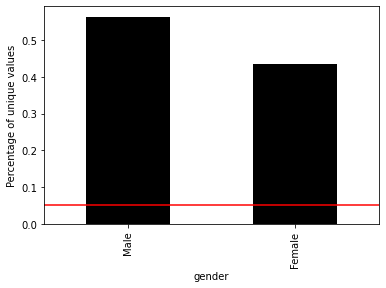

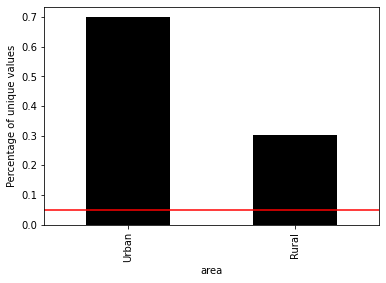

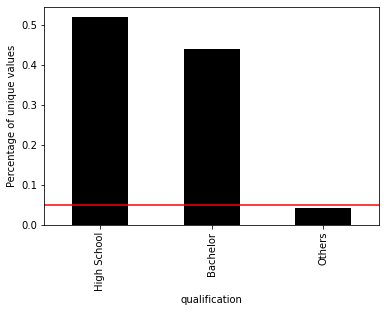

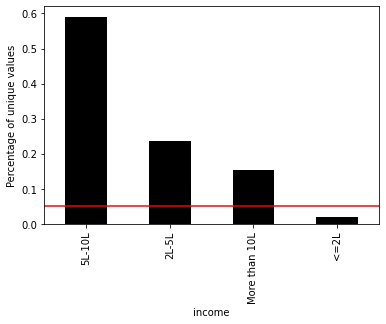

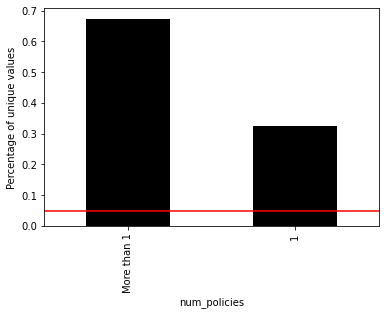

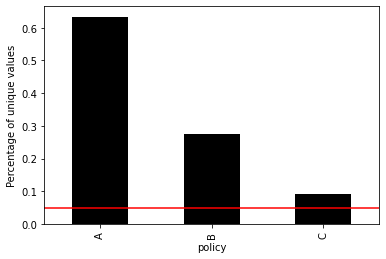

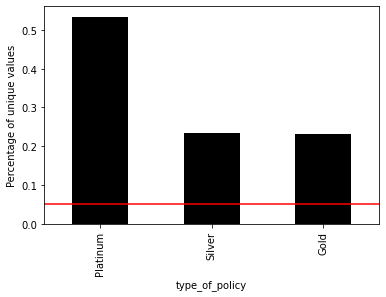

In [16]:
for i in df.select_dtypes('O').columns:
    plt.figure()
    value=df[i].value_counts()/len(df)
    fig=value.plot.bar(color='k')
    fig.axhline(0.05, color='red')#to spot values that are less than 5%
    fig.set_xlabel(i)
    fig.set_ylabel('Percentage of unique values')
    print()
  

### Relationship between target and categorical variables

In [17]:
#PIVOT TABLE
for k in df.select_dtypes('O').columns:
    p=df.pivot_table('cltv',k,aggfunc=np.mean)
    print('_________________________________________\n',p)

_________________________________________
                 cltv
gender              
Female  97928.006670
Male    97759.161617
_________________________________________
                 cltv
area                
Rural   79775.446463
Urban  105609.370304
_________________________________________
                        cltv
qualification              
Bachelor       98444.583468
High School    98911.503603
Others         78060.164274
_________________________________________
                         cltv
income                      
2L-5L          109104.949497
5L-10L          95037.658391
<=2L           110750.663934
More than 10L   89455.725817
_________________________________________
                        cltv
num_policies               
1              50939.926945
More than 1   120530.883705
_________________________________________
                  cltv
policy               
A       100106.874523
B        89518.688215
C       107108.994946
______________________________________

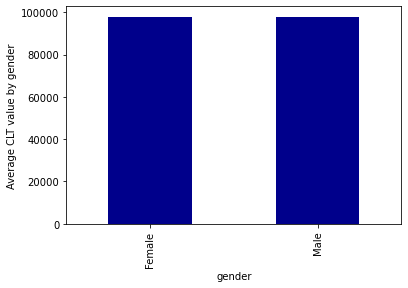

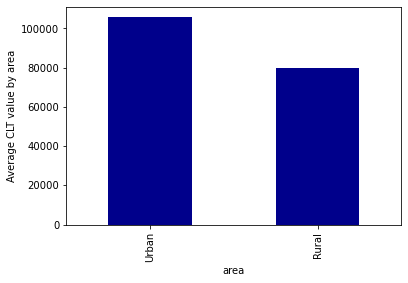

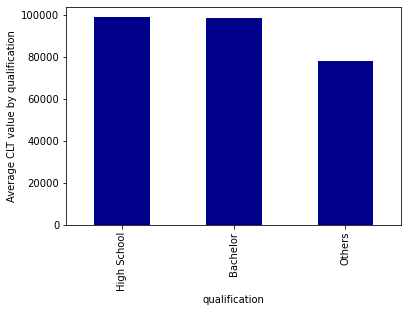

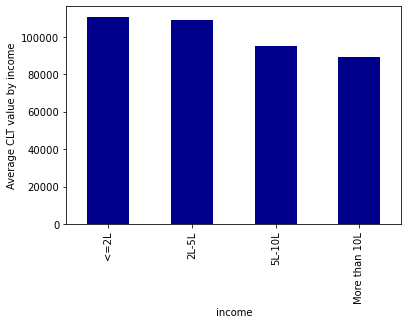

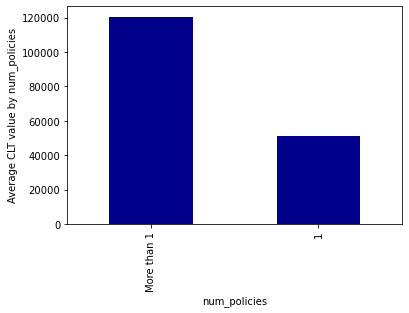

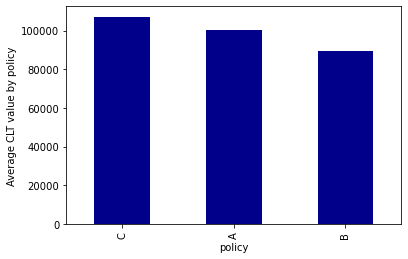

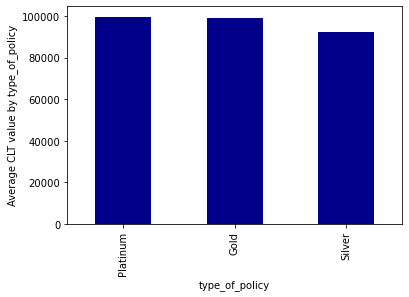

In [18]:
for i in df.select_dtypes('O').columns:
    plt.figure()
    (df.groupby(i)['cltv'].mean()).sort_values(ascending=False).plot.bar(color='darkblue')
    plt.xlabel(i)
    plt.ylabel(f'Average CLT value by {i}');

### Checking and visualizing null values

In [19]:
df.isnull().sum()

id                0
gender            0
area              0
qualification     0
income            0
marital_status    0
vintage           0
claim_amount      0
num_policies      0
policy            0
type_of_policy    0
cltv              0
dtype: int64

In [20]:
df.isnull().mean()

id                0.0
gender            0.0
area              0.0
qualification     0.0
income            0.0
marital_status    0.0
vintage           0.0
claim_amount      0.0
num_policies      0.0
policy            0.0
type_of_policy    0.0
cltv              0.0
dtype: float64

### Checking for Outliers for with boxplot

In [21]:
for i in df.select_dtypes('number').columns:
    plt.figure()
    fig=px.box(df,x=i)
    fig.show();
    

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

### Checking for outliers with IQR rule

In [22]:
def iqr(data,variable):
    Q3 = data[variable].quantile(0.75)
    Q1 = data[variable].quantile(0.25)
    IQR = Q3 - Q1
    
    upper_limit = Q3 + 1.5*IQR
    lower_limit = Q1 - 1.5*IQR
    
    return upper_limit, lower_limit

In [23]:
upper_limit, lower_limit = iqr(df,'claim_amount')

In [24]:
outliers = np.where(df['claim_amount']>upper_limit, True, np.where(df['claim_amount']<lower_limit, True, False))
df.loc[outliers]

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv
33454,33455,Male,Urban,High School,2L-5L,0,3,13011,More than 1,C,Gold,66300
29560,29561,Female,Urban,High School,5L-10L,1,7,13620,More than 1,A,Platinum,450900
57087,57088,Male,Urban,Bachelor,5L-10L,0,3,17889,More than 1,A,Gold,62364
70102,70103,Male,Urban,Others,5L-10L,0,7,12016,More than 1,B,Silver,72612
6104,6105,Male,Urban,High School,5L-10L,0,7,13059,More than 1,C,Platinum,320508
...,...,...,...,...,...,...,...,...,...,...,...,...
38040,38041,Male,Urban,High School,2L-5L,0,8,14661,1,A,Platinum,63120
13907,13908,Male,Urban,High School,More than 10L,0,7,19536,More than 1,B,Silver,95340
13429,13430,Male,Rural,High School,5L-10L,0,1,18620,1,C,Platinum,59556
68755,68756,Male,Urban,Bachelor,5L-10L,0,7,12837,More than 1,B,Silver,182724


### Checking variable distribution

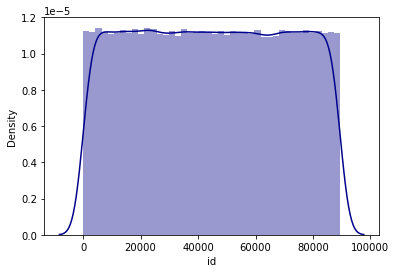

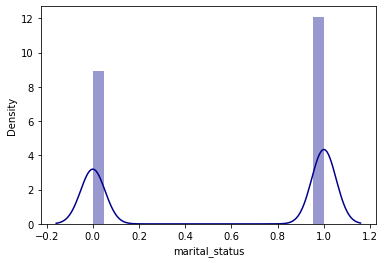

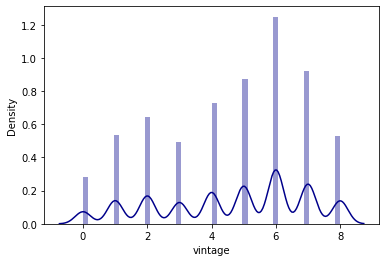

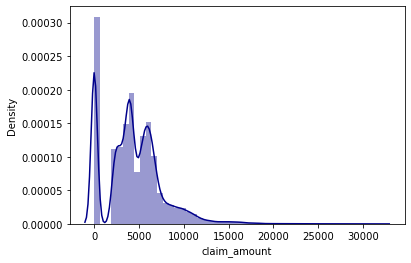

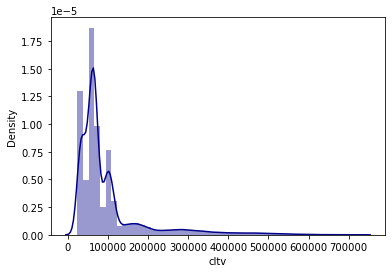

In [25]:
for i in df.select_dtypes('number').columns:
    plt.figure()
    sns.distplot(df[i],color='darkblue')

### Checking relationship between target variable and numerical columns

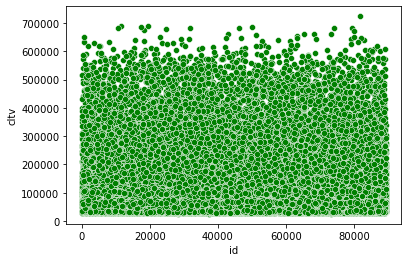

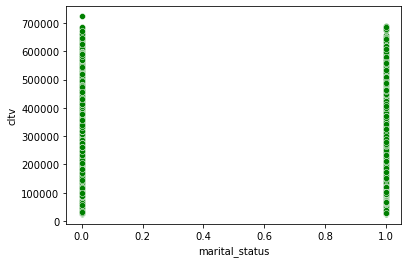

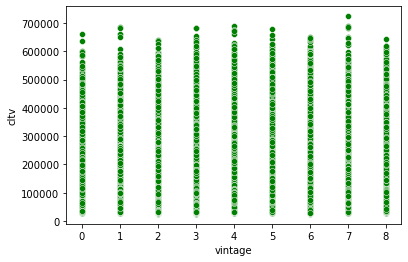

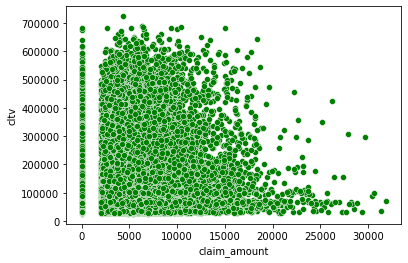

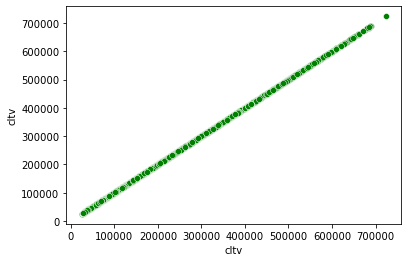

In [26]:
for i in df.select_dtypes('number').columns:
    plt.figure()
    sns.scatterplot(df,x=i,y='cltv',color='green')

### Checking statistics of target variable

In [27]:
skew = df['cltv'].skew()
kurtosis = df['cltv'].kurt()

mean = df['cltv'].mean()
median = df['cltv'].median()

if mean>median:
    print('Variable is right skewed')
    
else:
    print('Variable is left skewed')
    
print('Mean',mean)
print('Skew',skew)
print('Median',median)
print('Kurtosis', kurtosis)

Variable is right skewed
Mean 97832.78592703425
Skew 2.7660516002611795
Median 66384.0
Kurtosis 8.415667858932023


### Checking for linearity

<Figure size 432x288 with 0 Axes>

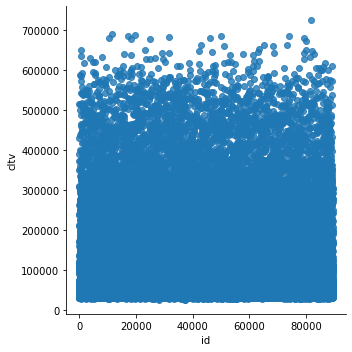

<Figure size 432x288 with 0 Axes>

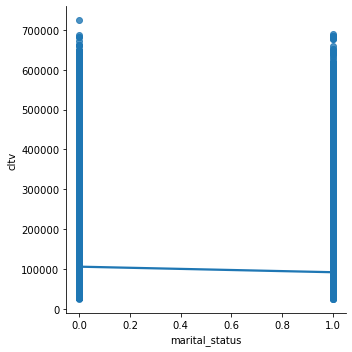

<Figure size 432x288 with 0 Axes>

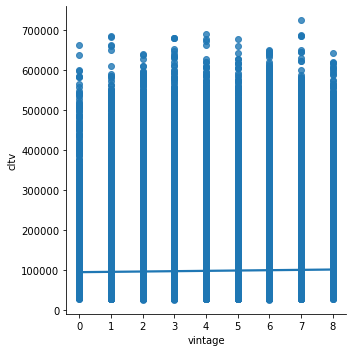

<Figure size 432x288 with 0 Axes>

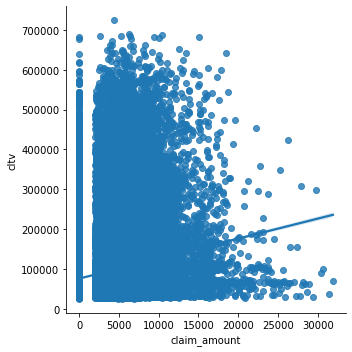

<Figure size 432x288 with 0 Axes>

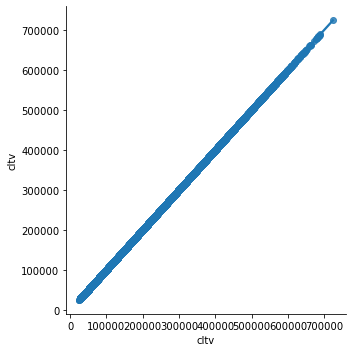

In [28]:
for i in df.select_dtypes('number').columns:
    plt.figure()
    sns.lmplot(df,x=i,y='cltv')

### Checking for normality

In [29]:
from scipy.stats import shapiro

In [30]:
for i in df.select_dtypes('number'):
    print('VARIABLE:',i.upper())
    pvalue=stats.shapiro(df[i])[1]
    if pvalue<0.05:
        print('Null hypothesis rejected. Data is not normal')
    else:
        print('Null hypothesis accepted. Data is normal')
    print()

VARIABLE: ID


<IPython.core.display.Javascript object>

Null hypothesis rejected. Data is not normal

VARIABLE: MARITAL_STATUS


<IPython.core.display.Javascript object>

Null hypothesis rejected. Data is not normal

VARIABLE: VINTAGE


<IPython.core.display.Javascript object>

Null hypothesis rejected. Data is not normal

VARIABLE: CLAIM_AMOUNT


<IPython.core.display.Javascript object>

Null hypothesis rejected. Data is not normal

VARIABLE: CLTV


<IPython.core.display.Javascript object>

Null hypothesis rejected. Data is not normal



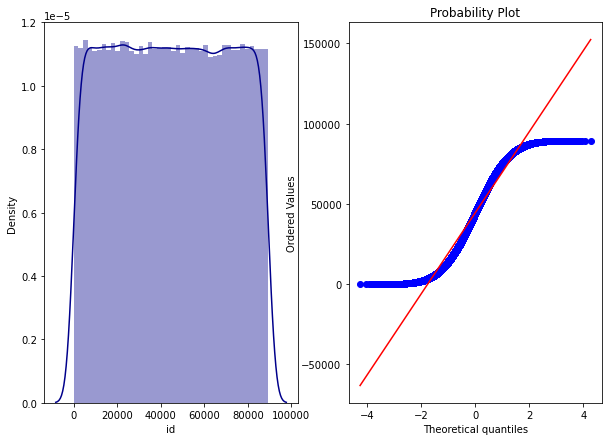

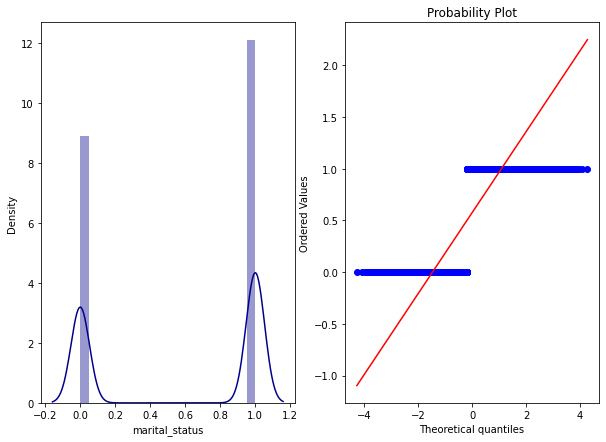

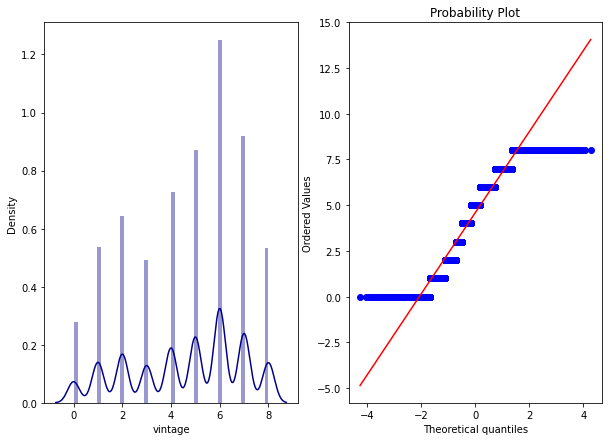

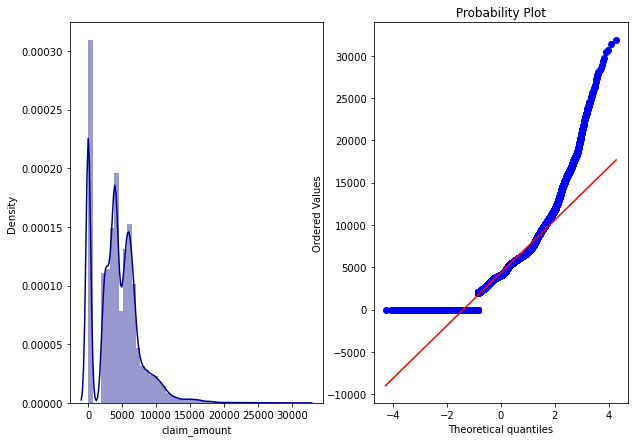

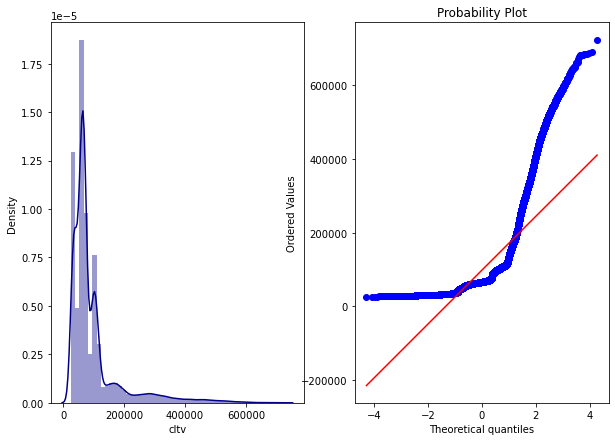

In [31]:
def distribution_plot(data,variable):
    plt.figure(figsize=(10,7))
    plt.subplot(1,2,1)
    sns.distplot(data[variable],kde=True,color='darkblue')

    plt.subplot(122)
    #Q-Q plot
    scipy.stats.probplot(data[variable],dist='norm',plot=plt)
    

for i in df.select_dtypes('number').columns:
    distribution_plot(df,i)        

### Correlation

<AxesSubplot:>

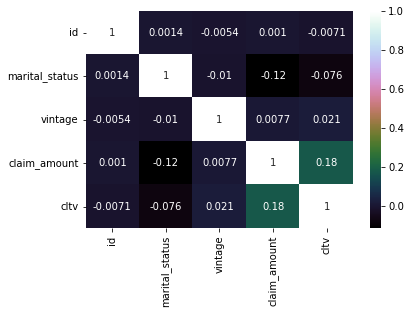

In [32]:
sns.heatmap(df.corr(),annot=True,cmap='cubehelix')

## BASELINE MODEL

In [33]:
train_copy=df.copy()

ytrain=train_copy['cltv']
xtrain=train_copy.drop(['cltv','id'],axis=1)
y_mean_1=ytrain.mean()

y_base=[y_mean_1]*len(ytrain)

base_mae=mean_absolute_error(y_base,ytrain)
base_rmse = np.sqrt(mean_squared_error(y_base,ytrain))
base_mse = mean_squared_error(y_base,ytrain)
base_r2  = r2_score(ytrain, y_base)

print("Mean apt price:", y_mean_1)
print("Baseline MAE:", base_mae)
print('RMSE:',base_rmse)
print('R2_Score:', base_r2)

Mean apt price: 97832.78592703425
Baseline MAE: 57395.52775843217
RMSE: 90666.38908331197
R2_Score: 0.0


In [34]:
metrics_table_1= pd.DataFrame({'Mean_absolute_error':base_mae,
                                    'Mean_squared_error':base_mse,
                                    'Root_mean_squared_error':base_rmse,
                                    'R2_score':base_r2},index=['Baseline_Model'])
metrics_table_1

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Baseline_Model,57395.527758,8.220394e+09,90666.389083,0.0


## EXPERIMENT 1 : NOT DROPPING OUTLIERS

#### FEATURE ENGINEERING

In [35]:
num = xtrain.select_dtypes('number')
cat = xtrain.select_dtypes('O')
num_attr=list(num)
cat_attr=list(cat)

# SCALING AND ENCODING
full_pipeline=ColumnTransformer([('num',RobustScaler(),num_attr),('cat',OneHotEncoder(),cat_attr),],verbose_feature_names_out=True)

In [36]:
df_pipe=full_pipeline.fit_transform(xtrain)
features = full_pipeline.get_feature_names_out()

df_pipe = pd.DataFrame(df_pipe, columns = features)

In [37]:
df_pipe.columns

Index(['num__marital_status', 'num__vintage', 'num__claim_amount',
       'cat__gender_Female', 'cat__gender_Male', 'cat__area_Rural',
       'cat__area_Urban', 'cat__qualification_Bachelor',
       'cat__qualification_High School', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income_<=2L',
       'cat__income_More than 10L', 'cat__num_policies_1',
       'cat__num_policies_More than 1', 'cat__policy_A', 'cat__policy_B',
       'cat__policy_C', 'cat__type_of_policy_Gold',
       'cat__type_of_policy_Platinum', 'cat__type_of_policy_Silver'],
      dtype='object')

In [38]:
xtrain_1  = df_pipe.copy()
ytrain_1 =  ytrain.copy()

In [39]:
x_test  = X_test.drop(['id','cltv'],axis=1)
y_test = X_test['cltv']

test_pipe = full_pipeline.fit_transform(x_test)
features_ = full_pipeline.get_feature_names_out()

test_pipe_ = pd.DataFrame(test_pipe, columns = features_)

In [40]:
x_test = test_pipe_.copy()
regex = re.compile(r"\[|\]|<", re.IGNORECASE)

x_test.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in x_test.columns.values]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [41]:
x_test.columns

Index(['num__marital_status', 'num__vintage', 'num__claim_amount',
       'cat__gender_Female', 'cat__gender_Male', 'cat__area_Rural',
       'cat__area_Urban', 'cat__qualification_Bachelor',
       'cat__qualification_High School', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income__=2L',
       'cat__income_More than 10L', 'cat__num_policies_1',
       'cat__num_policies_More than 1', 'cat__policy_A', 'cat__policy_B',
       'cat__policy_C', 'cat__type_of_policy_Gold',
       'cat__type_of_policy_Platinum', 'cat__type_of_policy_Silver'],
      dtype='object')

#### MODEL BUILDING

In [42]:
def regression_model_1(model):
    regex = re.compile(r"\[|\]|<", re.IGNORECASE)

    xtrain_1.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in xtrain_1.columns.values]

    
    model.fit(xtrain_1,ytrain_1)
    
    train_pred=model.predict(xtrain_1)
     
    r2score=r2_score(ytrain_1,train_pred)
    
    mae=mean_absolute_error(train_pred,ytrain_1)
    
    mse=mean_squared_error(ytrain_1,train_pred)
    
     #to evaluate whether the RMSE is high or low, we can compare it with the standard deviation of the dependent variable. 
    # A RMSE value lower than the standard deviation indicates good model performance
    
    std=np.std(ytrain_1)
    
    root_mean_squared_error=np.sqrt(mse)
    
    normalised_rmse=root_mean_squared_error/(ytrain_1.max()- ytrain_1.min())
    
    
    n=xtrain_1.shape[0]
    p=xtrain_1.shape[1]
    adjusted_r2 = 1 - (1-r2score) *(n-1)/(n-p-1)
    
    
    
    
   
    print('Train_Mean_absolute_error','---',mae)
    print('Train_R2_score','---',r2score)
    print('Train_Mean_squared_error','---',mse)
    print('Train_Root_mean_squared_error','---',root_mean_squared_error)
    print('Standard deviation of dependent variable','---',std)

    print('Train_Adjusted_r2','---',adjusted_r2)
    print('Train_Normalised_rmse','---',normalised_rmse)
    print()
    print()
    
    
    sns.regplot(x=train_pred,y=ytrain_1)
    plt.title('Predicted vs Actual ')
    plt.xlabel('Predicted')
    plt.ylabel('Actual values')
    plt.show();
    
    stat=pd.DataFrame(ytrain_1)
    
    stat['Predicted']=train_pred
    
    stat['Residuals']=stat.iloc[:,0] - stat['Predicted']

    stat['Diff_in_%']=abs((stat['Residuals']/stat.iloc[:,0])*100)



    #to view all data
    pd.options.display.max_rows=1000
    stat= stat.sort_values(by='Diff_in_%')
    print(stat)
    
    metrics_table_1= pd.DataFrame({'Mean_absolute_error':mae,
                                    'Mean_squared_error':mse,
                                    'Root_mean_squared_error':root_mean_squared_error,
                                    'R2_score':r2score},index=[0])



    
    return model,metrics_table_1

def regression_weights(model):
    model.fit(xtrain_1,ytrain_1)
    
    coefficients=model.coef_
    
    intercept=model.intercept_
    
    return coefficients,intercept


## DECISION TREE 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 4797.089853994295
Train_R2_score --- 0.9437798149535357
Train_Mean_squared_error --- 462152077.98569965
Train_Root_mean_squared_error --- 21497.722623238482
Standard deviation of dependent variable --- 90666.38908331191
Train_Adjusted_r2 --- 0.9437625140153483
Train_Normalised_rmse --- 0.030744411966189693




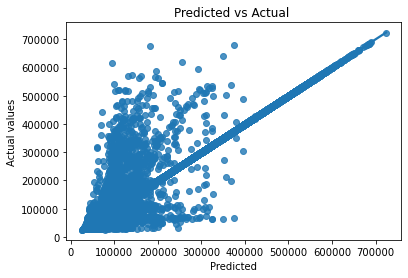

         cltv  Predicted  Residuals   Diff_in_%
15493  110148   110148.0        0.0    0.000000
22142   97176    97176.0        0.0    0.000000
83759   41928    41928.0        0.0    0.000000
33139   68160    68160.0        0.0    0.000000
40765   98796    98796.0        0.0    0.000000
...       ...        ...        ...         ...
72694   67008   374106.0  -307098.0  458.300501
13758   61824   350646.0  -288822.0  467.168090
52252   33156   191574.0  -158418.0  477.795874
44383   32172   186516.0  -154344.0  479.746363
20308   31056   245460.0  -214404.0  690.378671

[71513 rows x 4 columns]


In [43]:
tree_1 = DecisionTreeRegressor()

tree_model,metrics_table_1a = regression_model_1(tree_1)

In [44]:
metrics_table_1a.index=['Decision_Tree_regression_experiment_1']
metrics_table_1a

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Decision_Tree_regression_experiment_1,4797.089854,4.621521e+08,21497.722623,0.94378


## KNN

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 45500.66930488163
Train_R2_score --- 0.31976857292189265
Train_Mean_squared_error --- 5591770416.186059
Train_Root_mean_squared_error --- 74778.14129935337
Standard deviation of dependent variable --- 90666.38908331191
Train_Adjusted_r2 --- 0.3195592416672316
Train_Normalised_rmse --- 0.10694202462581284




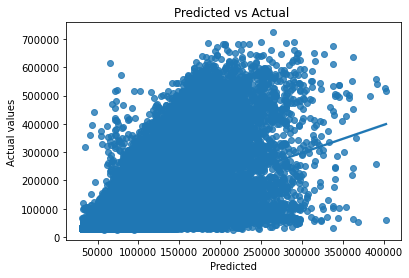

         cltv  Predicted  Residuals   Diff_in_%
4384    72108    72110.4       -2.4    0.003328
20812   62808    62810.4       -2.4    0.003821
46325   56316    56313.6        2.4    0.004262
55169   97164    97159.2        4.8    0.004940
46603  143628   143635.2       -7.2    0.005013
...       ...        ...        ...         ...
19055   29640   247778.4  -218138.4  735.959514
52028   34248   287572.8  -253324.8  739.677645
28205   25284   215210.4  -189926.4  751.172283
34064   30012   278263.2  -248251.2  827.173131
75796   31668   337466.4  -305798.4  965.638499

[71513 rows x 4 columns]


In [45]:
knn = KNeighborsRegressor()

knn_model,metrics_table_1b = regression_model_1(knn)

In [46]:
metrics_table_1b.index=['KNN_regression_experiment_1']
metrics_table_1b

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
KNN_regression_experiment_1,45500.669305,5.591770e+09,74778.141299,0.319769


## GRADIENT BOOSTING 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 50282.25889410361
Train_R2_score --- 0.1658547393332941
Train_Mean_squared_error --- 6857002787.173948
Train_Root_mean_squared_error --- 82807.02136397583
Standard deviation of dependent variable --- 90666.38908331191
Train_Adjusted_r2 --- 0.16559804335155304
Train_Normalised_rmse --- 0.11842431978144247




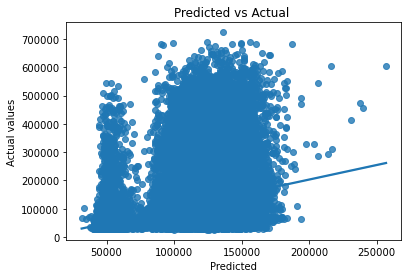

         cltv      Predicted      Residuals   Diff_in_%
17959  113148  113148.060533      -0.060533    0.000053
30152   54936   54935.934167       0.065833    0.000120
39697   49416   49416.107294      -0.107294    0.000217
11161  114564  114564.828425      -0.828425    0.000723
52849   59880   59878.982235       1.017765    0.001700
...       ...            ...            ...         ...
63707   29652  155960.652401 -126308.652401  425.970094
43022   31884  167915.780267 -136031.780267  426.645905
81410   28032  149542.391125 -121510.391125  433.470288
39073   29604  165453.632887 -135849.632887  458.889450
7577    28824  162261.951643 -133437.951643  462.940437

[71513 rows x 4 columns]


In [47]:
gradient = GradientBoostingRegressor()

grad,metrics_table_1d = regression_model_1(gradient)

In [48]:
metrics_table_1d.index = ['Gradient_boost_regression_experiment_1']
metrics_table_1d

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boost_regression_experiment_1,50282.258894,6.857003e+09,82807.021364,0.165855


### XGBOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 47326.474090853124
Train_R2_score --- 0.26481483486246504
Train_Mean_squared_error --- 6043511800.819646
Train_Root_mean_squared_error --- 77740.02701838767
Standard deviation of dependent variable --- 90666.38908331191
Train_Adjusted_r2 --- 0.26458859240012034
Train_Normalised_rmse --- 0.1111778888770489




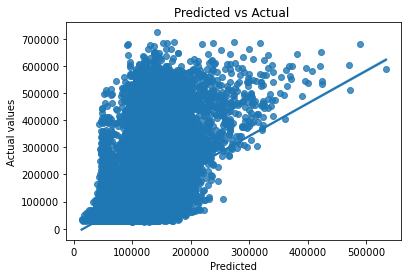

         cltv      Predicted      Residuals   Diff_in_%
56284  111984  111986.804688      -2.804688    0.002505
61901  116988  116992.093750      -4.093750    0.003499
56953   92952   92955.484375      -3.484375    0.003749
79919  111276  111271.765625       4.234375    0.003805
43682   88920   88925.445312      -5.445312    0.006124
...       ...            ...            ...         ...
74320   31392  165884.234375 -134492.234375  428.428375
28443   33060  179215.484375 -146155.484375  442.091614
21019   29124  158684.765625 -129560.765625  444.859131
44267   30084  167735.656250 -137651.656250  457.557678
46287   28872  169461.781250 -140589.781250  486.941620

[71513 rows x 4 columns]


In [49]:
xgb_=xgb.XGBRegressor()


xgb_model,metrics_table_1e = regression_model_1(xgb_)

In [50]:
metrics_table_1e.index=['XGBoost_Regression_experiment_1']
metrics_table_1e

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
XGBoost_Regression_experiment_1,47326.474091,6.043512e+09,77740.027018,0.264815


## RANDOM FOREST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 23068.795673704273
Train_R2_score --- 0.8218621825235028
Train_Mean_squared_error --- 1464363065.446329
Train_Root_mean_squared_error --- 38266.99707902789
Standard deviation of dependent variable --- 90666.38908331191
Train_Adjusted_r2 --- 0.8218073632203208
Train_Normalised_rmse --- 0.054726556088078325




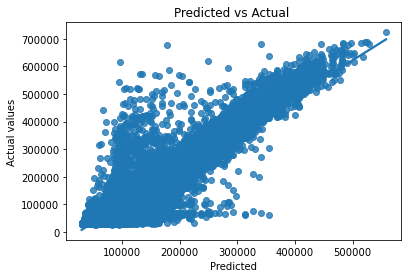

         cltv      Predicted      Residuals   Diff_in_%
27850   58176   58176.480000      -0.480000    0.000825
8692   115596  115594.800000       1.200000    0.001038
56187   68592   68592.780000      -0.780000    0.001137
81706   69828   69826.712952       1.287048    0.001843
18537   36912   36911.160000       0.840000    0.002276
...       ...            ...            ...         ...
44637   36192  189753.791429 -153561.791429  424.297611
73979   29928  157152.756168 -127224.756168  425.102767
73968   32088  177740.040000 -145652.040000  453.914361
13758   61824  354352.407286 -292528.407286  473.163185
20308   31056  224553.909143 -193497.909143  623.061274

[71513 rows x 4 columns]


In [51]:
forest=RandomForestRegressor()

forest_model,metrics_table_1f = regression_model_1(forest)

In [52]:
metrics_table_1f.index=['Random_forest_experiment_1']
metrics_table_1f

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Random_forest_experiment_1,23068.795674,1.464363e+09,38266.997079,0.821862


## ADABOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 66256.08279959194
Train_R2_score --- 0.021633494738315107
Train_Mean_squared_error --- 8042558256.6937895
Train_Root_mean_squared_error --- 89680.31142170387
Standard deviation of dependent variable --- 90666.38908331191
Train_Adjusted_r2 --- 0.02133241678173714
Train_Normalised_rmse --- 0.1282539777783077




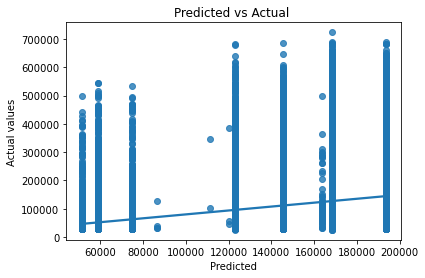

         cltv      Predicted      Residuals   Diff_in_%
43367   51300   51300.305070      -0.305070    0.000595
75282   51300   51300.305070      -0.305070    0.000595
25924  193644  193646.436216      -2.436216    0.001258
22829  168180  168187.013188      -7.013188    0.004170
1139    58968   58972.294256      -4.294256    0.007282
...       ...            ...            ...         ...
46287   28872  193646.436216 -164774.436216  570.706692
7577    28824  193646.436216 -164822.436216  571.823606
37308   24828  168187.013188 -143359.013188  577.408624
78407   28548  193646.436216 -165098.436216  578.318748
81410   28032  193646.436216 -165614.436216  590.804924

[71513 rows x 4 columns]


In [53]:
adaboost=AdaBoostRegressor()

adaboost_model,metrics_table_1g = regression_model_1(adaboost)


In [54]:
metrics_table_1g.index=['Adaboost_experiment_1']
metrics_table_1g

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Adaboost_experiment_1,66256.0828,8.042558e+09,89680.311422,0.021633


## EXTRA TREES

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 4797.089853994295
Train_R2_score --- 0.9437798149535357
Train_Mean_squared_error --- 462152077.98569965
Train_Root_mean_squared_error --- 21497.722623238482
Standard deviation of dependent variable --- 90666.38908331191
Train_Adjusted_r2 --- 0.9437625140153483
Train_Normalised_rmse --- 0.030744411966189693




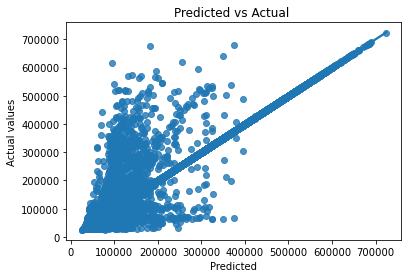

         cltv  Predicted  Residuals   Diff_in_%
15493  110148   110148.0        0.0    0.000000
22142   97176    97176.0        0.0    0.000000
83759   41928    41928.0        0.0    0.000000
33139   68160    68160.0        0.0    0.000000
40765   98796    98796.0        0.0    0.000000
...       ...        ...        ...         ...
72694   67008   374106.0  -307098.0  458.300501
13758   61824   350646.0  -288822.0  467.168090
52252   33156   191574.0  -158418.0  477.795874
44383   32172   186516.0  -154344.0  479.746363
20308   31056   245460.0  -214404.0  690.378671

[71513 rows x 4 columns]


In [55]:
xtrees = ExtraTreesRegressor()

xtrees_model, metrics_table_1h = regression_model_1(xtrees)

In [56]:
metrics_table_1h.index=['ExtraTrees_experiment_1']
metrics_table_1h

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
ExtraTrees_experiment_1,4797.089854,4.621521e+08,21497.722623,0.94378


In [57]:
metrics_table_A = pd.concat([metrics_table_1,metrics_table_1a,metrics_table_1b,metrics_table_1d,metrics_table_1e,metrics_table_1f,
                           metrics_table_1g,metrics_table_1h],axis=0)

In [58]:
metrics_table_A

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Baseline_Model,57395.527758,8.220394e+09,90666.389083,0.000000
Decision_Tree_regression_experiment_1,4797.089854,4.621521e+08,21497.722623,0.943780
KNN_regression_experiment_1,45500.669305,5.591770e+09,74778.141299,0.319769
Gradient_boost_regression_experiment_1,50282.258894,6.857003e+09,82807.021364,0.165855
XGBoost_Regression_experiment_1,47326.474091,6.043512e+09,77740.027018,0.264815
Random_forest_experiment_1,23068.795674,1.464363e+09,38266.997079,0.821862
Adaboost_experiment_1,66256.082800,8.042558e+09,89680.311422,0.021633
ExtraTrees_experiment_1,4797.089854,4.621521e+08,21497.722623,0.943780


## TESTING WITH BEST PERFORMING MODEL- DECISION TREES

In [59]:
test_pred = tree_model.predict(x_test)

In [60]:
np.sqrt(mean_squared_error(test_pred, y_test))

121692.80296476955

In [61]:
mean_absolute_error(test_pred, y_test)

69549.03796192647

In [62]:
r2_score(y_test, test_pred)

-0.8121815416461229

## EXPERIMENT 2: FEATURE SELECTION AND CROSS VALIDATION

In [63]:
xtrain_2  = df_pipe.copy()
ytrain_2 =  ytrain.copy()

#### Feature selection with lasso


In [64]:
from sklearn.linear_model import Lasso

from sklearn.feature_selection import SelectFromModel


feature_selection_model=SelectFromModel(Lasso(alpha=0.005,random_state=0))

feature_selection_model.fit(xtrain_2,ytrain_2)

feature_selection_model.get_support()

selected_features=xtrain_2.columns[(feature_selection_model.get_support())]
selected_features

Index(['num__marital_status', 'num__vintage', 'num__claim_amount',
       'cat__gender_Female', 'cat__area_Rural', 'cat__qualification_Bachelor',
       'cat__qualification_High School', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income_<=2L',
       'cat__income_More than 10L', 'cat__num_policies_1', 'cat__policy_A',
       'cat__policy_B', 'cat__policy_C', 'cat__type_of_policy_Gold',
       'cat__type_of_policy_Platinum', 'cat__type_of_policy_Silver'],
      dtype='object')

In [65]:
xtrain_2 = df_pipe[['num__marital_status', 'num__vintage', 'num__claim_amount',
       'cat__gender_Female', 'cat__area_Rural', 'cat__qualification_Bachelor',
       'cat__qualification_High School', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income_<=2L',
       'cat__income_More than 10L', 'cat__num_policies_1', 'cat__policy_A',
       'cat__policy_B', 'cat__policy_C', 'cat__type_of_policy_Gold',
       'cat__type_of_policy_Platinum', 'cat__type_of_policy_Silver']]


In [66]:
def regression_model_2(model):

    regex = re.compile(r"\[|\]|<", re.IGNORECASE)

    xtrain_2.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in xtrain_2.columns.values]

    
    
    model.fit(xtrain_2,ytrain_2)

    train_pred = cross_val_predict(model, xtrain_2, ytrain_2, cv=10)
    mse_score=abs(cross_val_score(model,xtrain_2,ytrain_2,scoring='neg_mean_squared_error',cv=10).mean())
    mae_score=abs(cross_val_score(model,xtrain_2,ytrain_2,scoring='neg_mean_absolute_error',cv=10).mean())
    r2score=cross_val_score(model,xtrain_2,ytrain_2,cv=10).mean()
    
    rmse = np.sqrt(mse_score)
    
    normalised_rmse=rmse/(ytrain_2.max()- ytrain_2.min())
    
    
    n=xtrain_2.shape[0]
    p=xtrain_2.shape[1]
    adjusted_r2 = 1 - (1-r2score) *(n-1)/(n-p-1)
    
    
    
    
   
    print('Train_Mean_absolute_error','---',mae_score)
    print('Train_R2_score','---',r2score)
    print('Train_Mean_squared_error','---',mse_score)
    print('Train_Root_mean_squared_error','---',rmse)

    print('Train_Adjusted_r2','---',adjusted_r2)
    print('Train_Normalised_rmse','---',normalised_rmse)
    print()
    print()
    
    
    sns.regplot(x=train_pred,y=ytrain_2)
    plt.title('Predicted vs Actual ')
    plt.xlabel('Predicted')
    plt.ylabel('Actual values')
    plt.show();
    
    stat=pd.DataFrame(ytrain_2)
    
    stat['Predicted']=train_pred
    
    stat['Residuals']=stat.iloc[:,0] - stat['Predicted']

    stat['Diff_in_%']=abs((stat['Residuals']/stat.iloc[:,0])*100)



    #to view all data
    pd.options.display.max_rows=1000
    stat= stat.sort_values(by='Diff_in_%')
    print(stat)
    
    metrics_table_2= pd.DataFrame({'Mean_absolute_error':mae_score,
                                    'Mean_squared_error':mse_score,
                                    'Root_mean_squared_error':rmse,
                                    'R2_score':r2score},index=[0])



    
    return model,metrics_table_2


## DECISION TREE

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 68086.47401259461
Train_R2_score --- -0.7485047205125961
Train_Mean_squared_error --- 14246166384.69609
Train_Root_mean_squared_error --- 119357.30553550583
Train_Adjusted_r2 --- -0.7489694036240859
Train_Normalised_rmse --- 0.17069576330802846




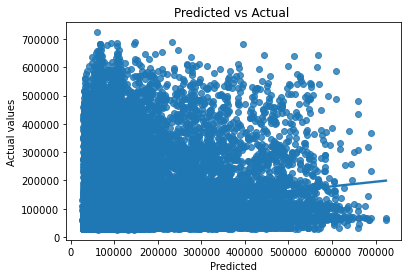

        cltv  Predicted  Residuals    Diff_in_%
44633  32460    32460.0        0.0     0.000000
6608   33252    33252.0        0.0     0.000000
3136   34008    34008.0        0.0     0.000000
14035  33372    33372.0        0.0     0.000000
15491  56304    56304.0        0.0     0.000000
...      ...        ...        ...          ...
24780  30168   544920.0  -514752.0  1706.284805
59024  32520   615816.0  -583296.0  1793.653137
78407  28548   557772.0  -529224.0  1853.804119
16630  33204   660468.0  -627264.0  1889.121793
1189   28404   568776.0  -540372.0  1902.450359

[71513 rows x 4 columns]


In [67]:
tree_2 = DecisionTreeRegressor()

tree_model_2,metrics_table_2a = regression_model_2(tree_2)

In [68]:
metrics_table_2a.index=['Decision_Tree_regression_experiment_2']
metrics_table_2a

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Decision_Tree_regression_experiment_2,68086.474013,1.424617e+10,119357.305536,-0.748505


## KNN

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 55860.50147545892
Train_R2_score --- -0.016286733685410316
Train_Mean_squared_error --- 8348988247.763548
Train_Root_mean_squared_error --- 91372.79818284842
Train_Adjusted_r2 --- -0.016556822336607047
Train_Normalised_rmse --- 0.1306744439432075




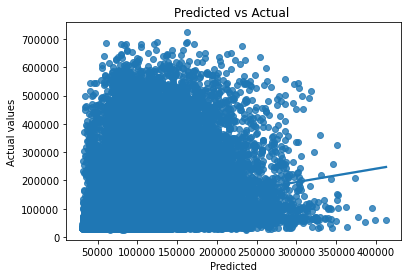

         cltv  Predicted  Residuals   Diff_in_%
66735  160464   160459.2        4.8    0.002991
74807   65868    65865.6        2.4    0.003644
88948  111564   111568.8       -4.8    0.004302
47190   51408    51410.4       -2.4    0.004669
56799   45564    45561.6        2.4    0.005267
...       ...        ...        ...         ...
18806   33936   329448.0  -295512.0  870.792079
34064   30012   293232.0  -263220.0  877.049180
40136   33996   362942.4  -328946.4  967.603247
88924   30636   327259.2  -296623.2  968.217783
75796   31668   344179.2  -312511.2  986.835923

[71513 rows x 4 columns]


In [69]:
knn = KNeighborsRegressor()

knn_model_2,metrics_table_2b = regression_model_2(knn)

In [70]:
metrics_table_2b.index=['KNN_regression_experiment_2']
metrics_table_2b

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
KNN_regression_experiment_2,55860.501475,8.348988e+09,91372.798183,-0.016287


## GRADIENT BOOSTING

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 50482.43863983222
Train_R2_score --- 0.15848451502357835
Train_Mean_squared_error --- 6916689491.243604
Train_Root_mean_squared_error --- 83166.63688789877
Train_Adjusted_r2 --- 0.15826087362911245
Train_Normalised_rmse --- 0.11893861462144438




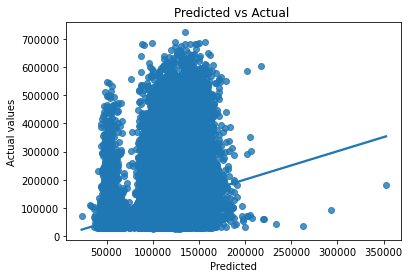

         cltv      Predicted      Residuals   Diff_in_%
23315  122544  122546.209784      -2.209784    0.001803
1840    56676   56677.238463      -1.238463    0.002185
79948  102552  102548.232288       3.767712    0.003674
45757  103800  103809.076647      -9.076647    0.008744
9733   113172  113161.532742      10.467258    0.009249
...       ...            ...            ...         ...
23400   42324  233501.642327 -191177.642327  451.700317
39073   29604  163961.533301 -134357.533301  453.849254
7577    28824  161481.473407 -132657.473407  460.232700
85470   30852  199600.401114 -168748.401114  546.960979
37062   36552  262203.186178 -225651.186178  617.342926

[71513 rows x 4 columns]


In [71]:
gradient = GradientBoostingRegressor()

grad_2,metrics_table_2d = regression_model_2(gradient)

In [72]:
metrics_table_2d.index = ['Gradient_boost_regression_experiment_2']
metrics_table_2d

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boost_regression_experiment_2,50482.43864,6.916689e+09,83166.636888,0.158485


## XGBOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51149.29294882533
Train_R2_score --- 0.1357713388855235
Train_Mean_squared_error --- 7103232853.503163
Train_Root_mean_squared_error --- 84280.67900475864
Train_Adjusted_r2 --- 0.1355416612309116
Train_Normalised_rmse --- 0.1205318331399214




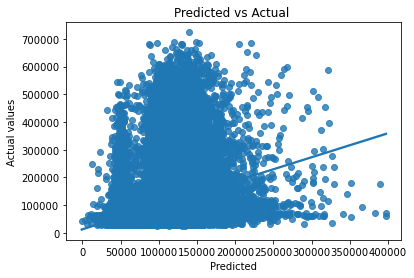

         cltv      Predicted      Residuals   Diff_in_%
61633  121248  121248.617188      -0.617188    0.000509
38577  100332  100332.914062      -0.914062    0.000911
29098  105252  105253.046875      -1.046875    0.000995
54070  162972  162970.328125       1.671875    0.001026
54608  114588  114589.460938      -1.460938    0.001275
...       ...            ...            ...         ...
15278   32292  222353.093750 -190061.093750  588.570190
18271   31956  224721.734375 -192765.734375  603.222351
47203   31680  246053.312500 -214373.312500  676.683411
22700   32736  289746.593750 -257010.593750  785.100769
37062   36552  326884.812500 -290332.812500  794.300720

[71513 rows x 4 columns]


In [73]:
xgb_=xgb.XGBRegressor()


xgb_model_2,metrics_table_2e = regression_model_2(xgb_)

In [74]:
metrics_table_2e.index=['XGBoost_Regression_experiment_2']
metrics_table_2e


,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
XGBoost_Regression_experiment_2,51149.292949,7.103233e+09,84280.679005,0.135771


## RANDOM FOREST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 55388.53295285243
Train_R2_score --- 0.0400553794617303
Train_Mean_squared_error --- 7882958829.112826
Train_Root_mean_squared_error --- 88786.02834406338
Train_Adjusted_r2 --- 0.03980026430653716
Train_Normalised_rmse --- 0.12697504196565326




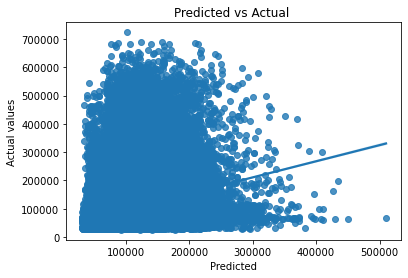

        cltv      Predicted      Residuals    Diff_in_%
70359  86364   86363.280000       0.720000     0.000834
48224  92244   92245.920000      -1.920000     0.002081
51295  37056   37055.020429       0.979571     0.002643
6047   43716   43714.326327       1.673673     0.003829
38375  49356   49353.840000       2.160000     0.004376
...      ...            ...            ...          ...
19855  29352  282545.280000 -253193.280000   862.609975
79055  31200  306718.300429 -275518.300429   883.071476
26528  28848  295472.880000 -266624.880000   924.240433
44784  32268  334499.280000 -302231.280000   936.628486
20308  31056  382070.694714 -351014.694714  1130.263700

[71513 rows x 4 columns]


In [75]:
forest=RandomForestRegressor()

forest_model_2,metrics_table_2f = regression_model_2(forest)

In [76]:
metrics_table_2f.index=['Random_forest_experiment_2']
metrics_table_2f


,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Random_forest_experiment_2,55388.532953,7.882959e+09,88786.028344,0.040055


## ADABOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 66046.16285650246
Train_R2_score --- -0.17591288406893588
Train_Mean_squared_error --- 8726497977.26769
Train_Root_mean_squared_error --- 93415.7266056829
Train_Adjusted_r2 --- -0.17622539501122825
Train_Normalised_rmse --- 0.1335960851863207




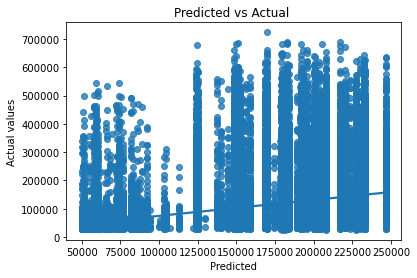

         cltv      Predicted      Residuals   Diff_in_%
30679   60384   60384.470018      -0.470018    0.000778
85164   71904   71900.981779       3.018221    0.004198
71829   55812   55809.412831       2.587169    0.004636
18415  195900  195918.527203     -18.527203    0.009457
31482  182736  182761.058597     -25.058597    0.013713
...       ...            ...            ...         ...
63707   29652  246747.956276 -217095.956276  732.146082
54019   27972  232993.527874 -205021.527874  732.952695
63497   29496  246672.394610 -217176.394610  736.291004
7577    28824  246672.394610 -217848.394610  755.788213
37308   24828  227322.787200 -202494.787200  815.590411

[71513 rows x 4 columns]


In [77]:
adaboost=AdaBoostRegressor()

adaboost_model_2,metrics_table_2g = regression_model_2(adaboost)

In [78]:
metrics_table_2g.index=['Adaboost_experiment_2']
metrics_table_2g

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Adaboost_experiment_2,66046.162857,8.726498e+09,93415.726606,-0.175913


## EXTRA TREES

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 59442.621649800545
Train_R2_score --- -0.21603526140938678
Train_Mean_squared_error --- 10008176276.60263
Train_Root_mean_squared_error --- 100040.87302999025
Train_Adjusted_r2 --- -0.21635843528608478
Train_Normalised_rmse --- 0.1430708669841403




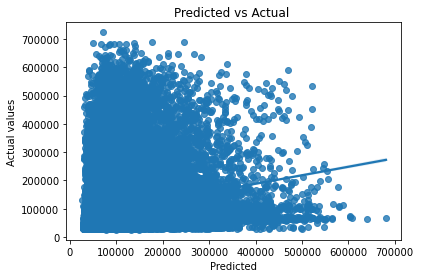

         cltv  Predicted  Residuals    Diff_in_%
35148   76284   76283.52       0.48     0.000629
20387   68244   68243.28       0.72     0.001055
88832   64080   64078.00       2.00     0.003121
63480  109488  109491.60      -3.60     0.003288
69985  108252  108258.24      -6.24     0.005764
...       ...        ...        ...          ...
88084   30108  449995.32 -419887.32  1394.603826
21775   36576  548114.40 -511538.40  1398.562992
75796   31668  481691.52 -450023.52  1421.067071
44784   32268  497517.00 -465249.00  1441.827817
1189    28404  499291.56 -470887.56  1657.821293

[71513 rows x 4 columns]


In [79]:
xtrees = ExtraTreesRegressor()

xtrees_model_2, metrics_table_2h = regression_model_2(xtrees)

In [80]:
metrics_table_2h.index=['ExtraTrees_experiment_2']
metrics_table_2h

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
ExtraTrees_experiment_2,59442.62165,1.000818e+10,100040.87303,-0.216035


In [81]:
metrics_table_2 = pd.concat([metrics_table_1,metrics_table_2a,metrics_table_2b,metrics_table_2d,metrics_table_2e,metrics_table_2f,
                           metrics_table_2g,metrics_table_2h],axis=0)
metrics_table_2

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Baseline_Model,57395.527758,8.220394e+09,90666.389083,0.000000
Decision_Tree_regression_experiment_2,68086.474013,1.424617e+10,119357.305536,-0.748505
KNN_regression_experiment_2,55860.501475,8.348988e+09,91372.798183,-0.016287
Gradient_boost_regression_experiment_2,50482.438640,6.916689e+09,83166.636888,0.158485
XGBoost_Regression_experiment_2,51149.292949,7.103233e+09,84280.679005,0.135771
Random_forest_experiment_2,55388.532953,7.882959e+09,88786.028344,0.040055
Adaboost_experiment_2,66046.162857,8.726498e+09,93415.726606,-0.175913
ExtraTrees_experiment_2,59442.621650,1.000818e+10,100040.873030,-0.216035


## EXPERIMENT 3: DROPPING OUTLIERS

#### FEATURE ENGINEERING

In [82]:
df_with_outliers_dropped = df.loc[~outliers]
df_with_outliers_dropped.shape,df.shape

((69719, 12), (71513, 12))

In [83]:
train_copy=df_with_outliers_dropped.copy()

ytrain_3=train_copy['cltv']
xtrain_3=train_copy.drop(['cltv','id'],axis=1)

num = xtrain_3.select_dtypes('number')
cat = xtrain_3.select_dtypes('O')
num_attr=list(num)
cat_attr=list(cat)

# SCALING 
full_pipeline_3 = ColumnTransformer([('num',RobustScaler(),num_attr),('cat',OneHotEncoder(),cat_attr),],
                                    verbose_feature_names_out=True)

df_pipe_3 =full_pipeline_3.fit_transform(xtrain_3)
features = full_pipeline_3.get_feature_names_out()

xtrain_3 = pd.DataFrame(df_pipe_3, columns = features)

#### MODEL BUILDING

In [84]:
def regression_model_3(model):
    regex = re.compile(r"\[|\]|<", re.IGNORECASE)

    xtrain_3.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in xtrain_3.columns.values]

    
    model.fit(xtrain_3,ytrain_3)

    
    train_pred = cross_val_predict(model, xtrain_3, ytrain_3, cv=10)
    mse_score=abs(cross_val_score(model,xtrain_3,ytrain_3,scoring='neg_mean_squared_error',cv=10).mean())
    mae_score=abs(cross_val_score(model,xtrain_3,ytrain_3,scoring='neg_mean_absolute_error',cv=10).mean())
    r2score=cross_val_score(model,xtrain_3,ytrain_3,cv=10).mean()
    
    rmse = np.sqrt(mse_score)
    
    normalised_rmse=rmse/(ytrain_3.max()- ytrain_3.min())
    
    
    n=xtrain_3.shape[0]
    p=xtrain_3.shape[1]
    adjusted_r2 = 1 - (1-r2score) *(n-1)/(n-p-1)
    
    
    
    
   
    print('Train_Mean_absolute_error','---',mae_score)
    print('Train_R2_score','---',r2score)
    print('Train_Mean_squared_error','---',mse_score)
    print('Train_Root_mean_squared_error','---',rmse)

    print('Train_Adjusted_r2','---',adjusted_r2)
    print('Train_Normalised_rmse','---',normalised_rmse)
    print()
    print()
    
    
    sns.regplot(x=train_pred,y=ytrain_3)
    plt.title('Predicted vs Actual ')
    plt.xlabel('Predicted')
    plt.ylabel('Actual values')
    plt.show();
    
    stat=pd.DataFrame(ytrain_3)
    
    stat['Predicted']=train_pred
    
    stat['Residuals']=stat.iloc[:,0] - stat['Predicted']

    stat['Diff_in_%']=abs((stat['Residuals']/stat.iloc[:,0])*100)



    #to view all data
    pd.options.display.max_rows=1000
    stat= stat.sort_values(by='Diff_in_%')
    print(stat)
    
    metrics_table_3= pd.DataFrame({'Mean_absolute_error':mae_score,
                                    'Mean_squared_error':mse_score,
                                    'Root_mean_squared_error':rmse,
                                    'R2_score':r2score},index=[0])



    
    return model,metrics_table_3


## DECISION TREE

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 67033.32549989785
Train_R2_score --- -0.7465651764408552
Train_Mean_squared_error --- 13923112377.241404
Train_Root_mean_squared_error --- 117996.23882667364
Train_Adjusted_r2 --- -0.7471164912061459
Train_Normalised_rmse --- 0.1687492689586889




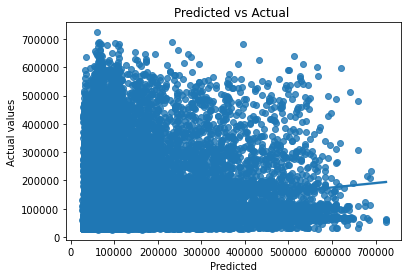

        cltv  Predicted  Residuals    Diff_in_%
76188  31500    31500.0        0.0     0.000000
78584  31920    31920.0        0.0     0.000000
82956  34560    34560.0        0.0     0.000000
43779  34224    34224.0        0.0     0.000000
3136   34008    34008.0        0.0     0.000000
...      ...        ...        ...          ...
8470   32952   598812.0  -565860.0  1717.225055
75796  31668   612000.0  -580332.0  1832.550208
73437  31428   610008.0  -578580.0  1840.969836
16630  33204   660468.0  -627264.0  1889.121793
1189   28404   568776.0  -540372.0  1902.450359

[69719 rows x 4 columns]


In [85]:
tree_3 = DecisionTreeRegressor()

tree_model_3,metrics_table_3a= regression_model_3(tree_3)

In [86]:
metrics_table_3a.index = ['Decision_Tree_experiment_3']
metrics_table_3a

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Decision_Tree_experiment_3,67033.3255,1.392311e+10,117996.238827,-0.746565


## KNN

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 54735.899447442825
Train_R2_score --- -0.01490920814279273
Train_Mean_squared_error --- 8135346009.506868
Train_Root_mean_squared_error --- 90196.15296400877
Train_Adjusted_r2 --- -0.015229570897888234
Train_Normalised_rmse --- 0.12899169521767742




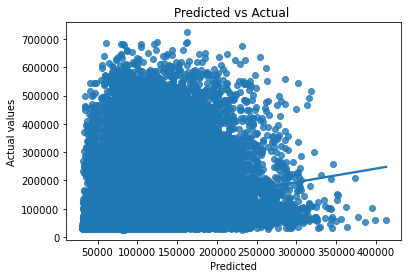

         cltv  Predicted  Residuals   Diff_in_%
66735  160464   160459.2        4.8    0.002991
74807   65868    65865.6        2.4    0.003644
88948  111564   111568.8       -4.8    0.004302
47190   51408    51410.4       -2.4    0.004669
84995   49092    49094.4       -2.4    0.004889
...       ...        ...        ...         ...
18806   33936   329448.0  -295512.0  870.792079
34064   30012   293232.0  -263220.0  877.049180
40136   33996   362942.4  -328946.4  967.603247
88924   30636   327259.2  -296623.2  968.217783
75796   31668   344179.2  -312511.2  986.835923

[69719 rows x 4 columns]


In [87]:
knn = KNeighborsRegressor()

knn_model_3,metrics_table_3b = regression_model_3(knn)

In [88]:
metrics_table_3b.index=['KNN_regression_experiment_3']
metrics_table_3b


,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
KNN_regression_experiment_3,54735.899447,8.135346e+09,90196.152964,-0.014909


## GRADIENT BOOSTING

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 49675.78424026171
Train_R2_score --- 0.15713581451080133
Train_Mean_squared_error --- 6759601802.616608
Train_Root_mean_squared_error --- 82216.79756969745
Train_Adjusted_r2 --- 0.15686975889669486
Train_Normalised_rmse --- 0.11758022648832654




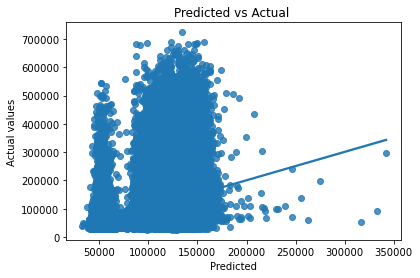

         cltv      Predicted      Residuals   Diff_in_%
56654  108240  108239.989344       0.010656    0.000010
84511   44268   44267.339175       0.660825    0.001493
46352   99276   99281.174133      -5.174133    0.005212
3986   113724  113730.529579      -6.529579    0.005742
54245   50160   50163.259257      -3.259257    0.006498
...       ...            ...            ...         ...
63707   29652  156995.792651 -127343.792651  429.461057
62446   34572  183480.470055 -148908.470055  430.719860
39073   29604  161006.522077 -131402.522077  443.867457
7577    28824  159128.020715 -130304.020715  452.067793
81083   51936  316106.549850 -264170.549850  508.646314

[69719 rows x 4 columns]


In [89]:
gradient = GradientBoostingRegressor()

grad_3,metrics_table_3d = regression_model_3(gradient)

In [90]:
metrics_table_3d.index = ['Gradient_boost_regression_experiment_3']
metrics_table_3d

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boost_regression_experiment_3,49675.78424,6.759602e+09,82216.79757,0.157136


## XGBOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 50336.71298654384
Train_R2_score --- 0.1339726921991445
Train_Mean_squared_error --- 6945610528.720594
Train_Root_mean_squared_error --- 83340.32954530834
Train_Adjusted_r2 --- 0.13369932499339932
Train_Normalised_rmse --- 0.119187016682839




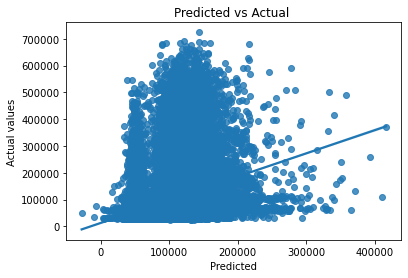

         cltv      Predicted      Residuals   Diff_in_%
30194  158124  158123.281250       0.718750    0.000455
61443  111816  111814.546875       1.453125    0.001300
11323  124872  124867.617188       4.382812    0.003510
46569   87768   87771.335938      -3.335938    0.003801
48694   48576   48573.281250       2.718750    0.005597
...       ...            ...            ...         ...
4184    34416  237039.984375 -202623.984375  588.749390
29136   31932  224980.000000 -193048.000000  604.559692
47203   31680  244456.375000 -212776.375000  671.642578
39073   29604  252348.250000 -222744.250000  752.412720
15278   32292  293697.843750 -261405.843750  809.506531

[69719 rows x 4 columns]


In [91]:
xgb_=xgb.XGBRegressor()


xgb_model_3,metrics_table_3e = regression_model_3(xgb_)

In [92]:
metrics_table_3e.index=['XGBoost_Regression_experiment_3']
metrics_table_3e


,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
XGBoost_Regression_experiment_3,50336.712987,6.945611e+09,83340.329545,0.133973


## RANDOM FOREST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 54568.75038866899
Train_R2_score --- 0.03793564266816294
Train_Mean_squared_error --- 7694982100.211374
Train_Root_mean_squared_error --- 87721.04707657892
Train_Adjusted_r2 --- 0.03763196073718711
Train_Normalised_rmse --- 0.12545198655194056




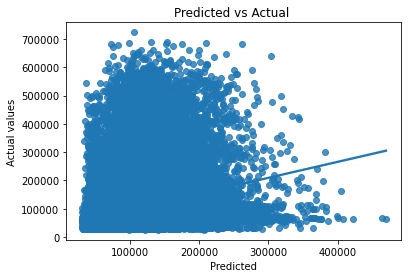

         cltv      Predicted      Residuals    Diff_in_%
24298  104520  104520.960000      -0.960000     0.000918
14027   88872   88870.680000       1.320000     0.001485
62763   99600   99590.520000       9.480000     0.009518
32581   48828   48834.120000      -6.120000     0.012534
56400   48540   48546.360000      -6.360000     0.013103
...       ...            ...            ...          ...
88924   30636  276860.760000 -246224.760000   803.710537
19855   29352  291271.920000 -261919.920000   892.340965
79055   31200  315813.078857 -284613.078857   912.221407
20308   31056  345710.979580 -314654.979580  1013.185792
44784   32268  364650.420000 -332382.420000  1030.068241

[69719 rows x 4 columns]


In [93]:
forest=RandomForestRegressor()

forest_model_3,metrics_table_3f = regression_model_3(forest)

In [94]:
metrics_table_3f.index=['Random_forest_experiment_3']
metrics_table_3f


,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Random_forest_experiment_3,54568.750389,7.694982e+09,87721.047077,0.037936


## ADABOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 80201.12633250674
Train_R2_score --- -0.15041511367433308
Train_Mean_squared_error --- 8249571959.931547
Train_Root_mean_squared_error --- 90827.15430933387
Train_Adjusted_r2 --- -0.15077824975819487
Train_Normalised_rmse --- 0.1298941054707023




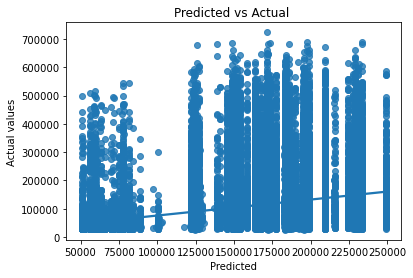

         cltv      Predicted      Residuals   Diff_in_%
19622   59112   59112.275596      -0.275596    0.000466
28529  163416  163414.835093       1.164907    0.000713
33598  163404  163414.835093     -10.835093    0.006631
50936   59772   59767.718580       4.281420    0.007163
9462    59244   59236.008644       7.991356    0.013489
...       ...            ...            ...         ...
7577    28824  230836.715631 -202012.715631  700.849000
11917   29064  233207.290040 -204143.290040  702.392272
46287   28872  233207.290040 -204335.290040  707.728214
49548   28476  231251.855842 -202775.855842  712.093889
20368   29832  249122.284791 -219290.284791  735.084087

[69719 rows x 4 columns]


In [95]:
adaboost=AdaBoostRegressor()

adaboost_model_3,metrics_table_3g = regression_model_3(adaboost)

In [96]:
metrics_table_3g.index=['Adaboost_experiment_3']
metrics_table_3g

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Adaboost_experiment_3,80201.126333,8.249572e+09,90827.154309,-0.150415


## EXTRA TREES

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 58249.899206306494
Train_R2_score --- -0.20458651293602967
Train_Mean_squared_error --- 9646542860.084835
Train_Root_mean_squared_error --- 98216.81556681033
Train_Adjusted_r2 --- -0.2049667485777391
Train_Normalised_rmse --- 0.1404622383828304




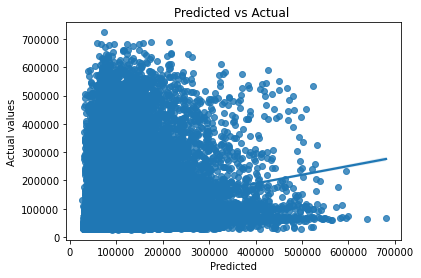

         cltv  Predicted  Residuals    Diff_in_%
20460  103764  103764.48      -0.48     0.000463
81177   49380   49380.36      -0.36     0.000729
83858   70692   70693.80      -1.80     0.002546
88832   64080   64078.00       2.00     0.003121
55101   97572   97579.08      -7.08     0.007256
...       ...        ...        ...          ...
20308   31056  459864.00 -428808.00  1380.757342
64714   35076  523524.36 -488448.36  1392.542935
44784   32268  483274.92 -451006.92  1397.690963
19855   29352  445667.52 -416315.52  1418.354865
1189    28404  497737.80 -469333.80  1652.351077

[69719 rows x 4 columns]


In [97]:
xtrees_3 = ExtraTreesRegressor()

xtrees_model_3, metrics_table_3h = regression_model_3(xtrees_3)

In [98]:
metrics_table_3h.index=['ExtraTrees_experiment_3']
metrics_table_3h

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
ExtraTrees_experiment_3,58249.899206,9.646543e+09,98216.815567,-0.204587


In [99]:

metrics_table_3 = pd.concat([metrics_table_1,metrics_table_3a,metrics_table_3b,metrics_table_3d,metrics_table_3e,metrics_table_3f,
                           metrics_table_3g,metrics_table_3h],axis=0)
metrics_table_3

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Baseline_Model,57395.527758,8.220394e+09,90666.389083,0.000000
Decision_Tree_experiment_3,67033.325500,1.392311e+10,117996.238827,-0.746565
KNN_regression_experiment_3,54735.899447,8.135346e+09,90196.152964,-0.014909
Gradient_boost_regression_experiment_3,49675.784240,6.759602e+09,82216.797570,0.157136
XGBoost_Regression_experiment_3,50336.712987,6.945611e+09,83340.329545,0.133973
Random_forest_experiment_3,54568.750389,7.694982e+09,87721.047077,0.037936
Adaboost_experiment_3,80201.126333,8.249572e+09,90827.154309,-0.150415
ExtraTrees_experiment_3,58249.899206,9.646543e+09,98216.815567,-0.204587


## EXPERIMENT 4: PERFORMING WINSORIZATION
Winsorization is the process of transforming the data by limiting the extreme values to a certain arbitrary value.

In [100]:
df_copy=df.copy()
df_copy.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv
15493,15494,Female,Rural,Bachelor,2L-5L,0,6,7626,More than 1,A,Gold,110148
71043,71044,Male,Urban,Bachelor,More than 10L,1,3,0,1,B,Platinum,32928
85477,85478,Female,Urban,Bachelor,2L-5L,1,7,2030,More than 1,B,Silver,50880
74581,74582,Male,Urban,Bachelor,5L-10L,0,6,5791,More than 1,B,Silver,93456
5220,5221,Male,Urban,Bachelor,More than 10L,0,5,0,More than 1,C,Gold,244092


In [101]:
def winsorize(data, variable, upper_limit, lower_limit):
    '''99% winsorizarion'''
    
    return np.where(data[variable] > upper_limit, upper_limit, np.where(data[variable] < lower_limit, lower_limit, 
                                                                        data[variable]))

In [102]:
df_copy['claim_amount'] =  winsorize(df_copy, 'claim_amount', df_copy['claim_amount'].quantile(0.995), df_copy['claim_amount'].quantile(0.005))


<AxesSubplot:xlabel='claim_amount', ylabel='Density'>

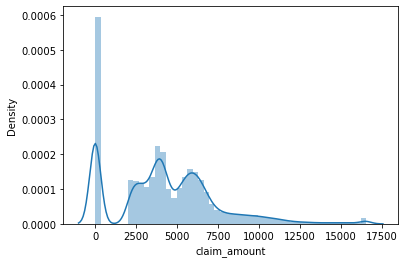

In [103]:
sns.distplot(df_copy['claim_amount'])

<AxesSubplot:xlabel='claim_amount', ylabel='Density'>

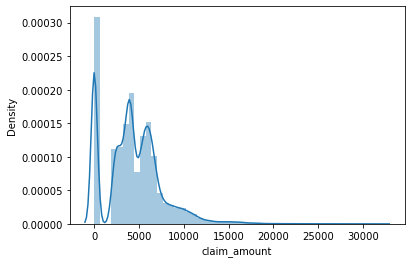

In [104]:
sns.distplot(df['claim_amount'])

In [105]:
xtrain_4 = df_copy.drop(['cltv','id'],axis=1)
ytrain_4 = df_copy['cltv']

In [106]:
num = xtrain_4.select_dtypes('number')
cat = xtrain_4.select_dtypes('O')
num_attr=list(num)
cat_attr=list(cat)

# SCALING 
full_pipeline4=ColumnTransformer([('num',RobustScaler(),num_attr),('cat',OneHotEncoder(),cat_attr),],
                                 verbose_feature_names_out=True)

In [107]:
df_pipe4=full_pipeline4.fit_transform(xtrain_4)
features = full_pipeline4.get_feature_names_out()

xtrain_4 = pd.DataFrame(df_pipe4, columns = features)


### MODEL BUILDING

In [108]:
def regression_model_4(model):

    regex = re.compile(r"\[|\]|<", re.IGNORECASE)

    xtrain_4.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in xtrain_4.columns.values]

    model.fit(xtrain_4,ytrain_4)

    train_pred = cross_val_predict(model, xtrain_4, ytrain_4, cv=10)
    mse_score=abs(cross_val_score(model,xtrain_4,ytrain_4,scoring='neg_mean_squared_error',cv=10).mean())
    mae_score=abs(cross_val_score(model,xtrain_4,ytrain_4,scoring='neg_mean_absolute_error',cv=10).mean())
    r2score=cross_val_score(model,xtrain_4,ytrain_4,cv=10).mean()
    
    rmse = np.sqrt(mse_score)
    
    normalised_rmse=rmse/(ytrain_4.max()- ytrain_4.min())
    
    
    n=xtrain_4.shape[0]
    p=xtrain_4.shape[1]
    adjusted_r2 = 1 - (1-r2score) *(n-1)/(n-p-1)
    
    
    
    
   
    print('Train_Mean_absolute_error','---',mae_score)
    print('Train_R2_score','---',r2score)
    print('Train_Mean_squared_error','---',mse_score)
    print('Train_Root_mean_squared_error','---',rmse)

    print('Train_Adjusted_r2','---',adjusted_r2)
    print('Train_Normalised_rmse','---',normalised_rmse)
    print()
    print()
    
    
    sns.regplot(x=train_pred,y=ytrain_4)
    plt.title('Predicted vs Actual ')
    plt.xlabel('Predicted')
    plt.ylabel('Actual values')
    plt.show();
    
    stat=pd.DataFrame(ytrain_4)
    
    stat['Predicted']=train_pred
    
    stat['Residuals']=stat.iloc[:,0] - stat['Predicted']

    stat['Diff_in_%']=abs((stat['Residuals']/stat.iloc[:,0])*100)



    #to view all data
    pd.options.display.max_rows=1000
    stat= stat.sort_values(by='Diff_in_%')
    print(stat)
    
    metrics_table_4= pd.DataFrame({'Mean_absolute_error':mae_score,
                                    'Mean_squared_error':mse_score,
                                    'Root_mean_squared_error':rmse,
                                    'R2_score':r2score},index=[0])



    
    return model,metrics_table_4


## DECISION TREE

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 67916.36390646225
Train_R2_score --- -0.7393940899763294
Train_Mean_squared_error --- 14276286275.38906
Train_Root_mean_squared_error --- 119483.41422720168
Train_Adjusted_r2 --- -0.7399293630212236
Train_Normalised_rmse --- 0.1708761143916276




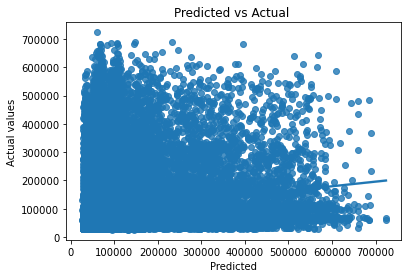

        cltv  Predicted  Residuals    Diff_in_%
27205  30840    30840.0        0.0     0.000000
78510  63456    63456.0        0.0     0.000000
3136   34008    34008.0        0.0     0.000000
14035  33372    33372.0        0.0     0.000000
15491  56304    56304.0        0.0     0.000000
...      ...        ...        ...          ...
19055  29640   521244.0  -491604.0  1658.582996
59024  32520   615816.0  -583296.0  1793.653137
78407  28548   557772.0  -529224.0  1853.804119
16630  33204   660468.0  -627264.0  1889.121793
1189   28404   568776.0  -540372.0  1902.450359

[71513 rows x 4 columns]


In [109]:
tree_4 = DecisionTreeRegressor()

tree_model_4,metrics_table_4a= regression_model_4(tree_4)

In [110]:
metrics_table_4a.index = ['Decision_Tree_experiment_4']
metrics_table_4a

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Decision_Tree_experiment_4,67916.363906,1.427629e+10,119483.414227,-0.739394


## KNN

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 55573.44543308347
Train_R2_score --- -0.01201202043479468
Train_Mean_squared_error --- 8313937241.358458
Train_Root_mean_squared_error --- 91180.79425711567
Train_Adjusted_r2 --- -0.01232345230567966
Train_Normalised_rmse --- 0.1303998544950456




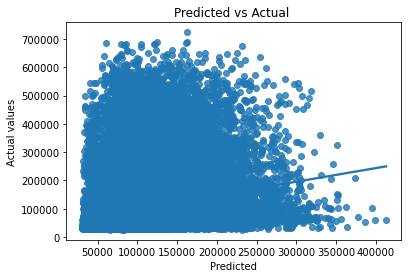

         cltv  Predicted  Residuals   Diff_in_%
66735  160464   160459.2        4.8    0.002991
74807   65868    65865.6        2.4    0.003644
88948  111564   111568.8       -4.8    0.004302
47190   51408    51410.4       -2.4    0.004669
56799   45564    45561.6        2.4    0.005267
...       ...        ...        ...         ...
18806   33936   329448.0  -295512.0  870.792079
34064   30012   293232.0  -263220.0  877.049180
40136   33996   362942.4  -328946.4  967.603247
88924   30636   327259.2  -296623.2  968.217783
75796   31668   344179.2  -312511.2  986.835923

[71513 rows x 4 columns]


In [111]:
knn = KNeighborsRegressor()

knn_model_4,metrics_table_4b = regression_model_4(knn)

In [112]:
metrics_table_4b.index=['KNN_regression_experiment_4']
metrics_table_4b

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
KNN_regression_experiment_4,55573.445433,8.313937e+09,91180.794257,-0.012012


## GRADIENT BOOSTING

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 50480.651690092665
Train_R2_score --- 0.15890380916548033
Train_Mean_squared_error --- 6913874582.405873
Train_Root_mean_squared_error --- 83149.71186002916
Train_Adjusted_r2 --- 0.15864497413682788
Train_Normalised_rmse --- 0.11891440973060631




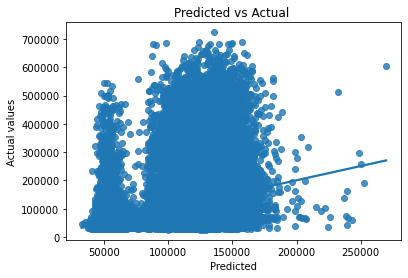

         cltv      Predicted      Residuals   Diff_in_%
62006   49608   49607.998789       0.001211    0.000002
70814  110040  110038.393458       1.606542    0.001460
7632    99960   99964.944950      -4.944950    0.004947
42723  139668  139658.966427       9.033573    0.006468
1227    86868   86861.196285       6.803715    0.007832
...       ...            ...            ...         ...
39073   29604  164601.968986 -134997.968986  456.012596
7577    28824  161227.762126 -132403.762126  459.352491
22700   32736  184485.521456 -151749.521456  463.555479
23400   42324  239016.334428 -196692.334428  464.730022
37062   36552  224424.592762 -187872.592762  513.987177

[71513 rows x 4 columns]


In [113]:
gradient = GradientBoostingRegressor()

grad_4,metrics_table_4d = regression_model_4(gradient)

In [114]:
metrics_table_4d.index = ['Gradient_boost_regression_experiment_4']
metrics_table_4d

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boost_regression_experiment_4,50480.65169,6.913875e+09,83149.71186,0.158904


## XGBOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51258.94776671749
Train_R2_score --- 0.13366758120065125
Train_Mean_squared_error --- 7120297792.57046
Train_Root_mean_squared_error --- 84381.85701067772
Train_Adjusted_r2 --- 0.13340098009261392
Train_Normalised_rmse --- 0.12067653024809467




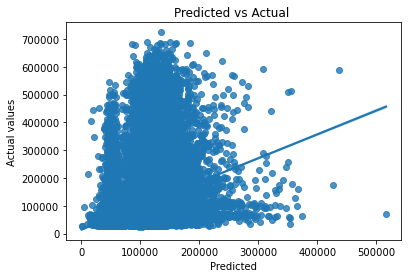

         cltv      Predicted      Residuals   Diff_in_%
81824  108972  108970.515625       1.484375    0.001362
16215   44664   44663.292969       0.707031    0.001583
18912  105096  105101.476562      -5.476562    0.005211
58125   58776   58779.117188      -3.117188    0.005304
27331  113400  113406.351562      -6.351562    0.005601
...       ...            ...            ...         ...
77985   41772  303087.125000 -261315.125000  625.574829
36353   70824  516162.937500 -445338.937500  628.796631
48533   28440  215573.437500 -187133.437500  657.993774
87270   34740  285236.500000 -250496.500000  721.060730
22700   32736  354161.218750 -321425.218750  981.870728

[71513 rows x 4 columns]


In [115]:
xgb_=xgb.XGBRegressor()


xgb_model_4,metrics_table_4e = regression_model_4(xgb_)

In [116]:
metrics_table_4e.index=['XGBoost_Regression_experiment_4']
metrics_table_4e

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
XGBoost_Regression_experiment_4,51258.947767,7.120298e+09,84381.857011,0.133668


## RANDOM FOREST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 55452.17184910724
Train_R2_score --- 0.039168245058371506
Train_Mean_squared_error --- 7888887812.532148
Train_Root_mean_squared_error --- 88819.41123725235
Train_Adjusted_r2 --- 0.03887256316427834
Train_Normalised_rmse --- 0.1270227836468914




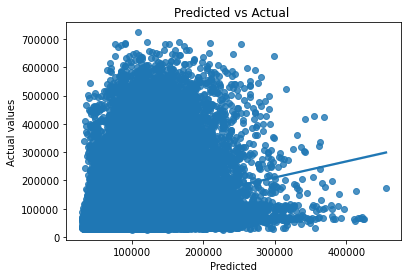

         cltv      Predicted      Residuals    Diff_in_%
17881  110652  110652.540000      -0.540000     0.000488
27467  110280  110279.040000       0.960000     0.000871
35604   62628   62628.600000      -0.600000     0.000958
71840  119244  119247.459190      -3.459190     0.002901
54193   96840   96845.230000      -5.230000     0.005401
...       ...            ...            ...          ...
79055   31200  290474.279857 -259274.279857   831.007307
73968   32088  311600.880000 -279512.880000   871.082274
44784   32268  314198.880000 -281930.880000   873.716623
19855   29352  297101.040000 -267749.040000   912.200327
20308   31056  355843.687040 -324787.687040  1045.813006

[71513 rows x 4 columns]


In [117]:
forest=RandomForestRegressor()

forest_model_4,metrics_table_4f = regression_model_4(forest)

In [118]:
metrics_table_4f.index=['Random_forest_experiment_4']
metrics_table_4f

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Random_forest_experiment_4,55452.171849,7.888888e+09,88819.411237,0.039168


## ADABOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 76513.68024663841
Train_R2_score --- -0.05592327544360093
Train_Mean_squared_error --- 9071830811.61702
Train_Root_mean_squared_error --- 95246.15903865636
Train_Adjusted_r2 --- -0.056248220359809586
Train_Normalised_rmse --- 0.1362138307857908




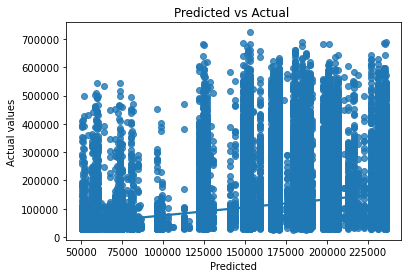

         cltv      Predicted      Residuals   Diff_in_%
89386   59688   59688.572449      -0.572449    0.000959
22422  151488  151476.253929      11.746071    0.007754
63851  226848  226826.138597      21.861403    0.009637
64028   59052   59045.330444       6.669556    0.011294
65848  179004  179026.264458     -22.264458    0.012438
...       ...            ...            ...         ...
11917   29064  236111.008305 -207047.008305  712.383045
86764   28752  235009.824648 -206257.824648  717.368617
51130   28176  235645.161200 -207469.161200  736.332912
9999    27924  235645.161200 -207721.161200  743.880394
57956   27972  236111.008305 -208139.008305  744.097699

[71513 rows x 4 columns]


In [119]:
adaboost=AdaBoostRegressor()

adaboost_model_4,metrics_table_4g = regression_model_4(adaboost)

In [120]:
metrics_table_4g.index=['Adaboost_experiment_4']
metrics_table_4g

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Adaboost_experiment_4,76513.680247,9.071831e+09,95246.159039,-0.055923


## EXTRA TREES

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 59241.430899281215
Train_R2_score --- -0.20540029258656262
Train_Mean_squared_error --- 9904054385.003006
Train_Root_mean_squared_error --- 99519.11567635137
Train_Adjusted_r2 --- -0.20577123686460008
Train_Normalised_rmse --- 0.14232468920020505




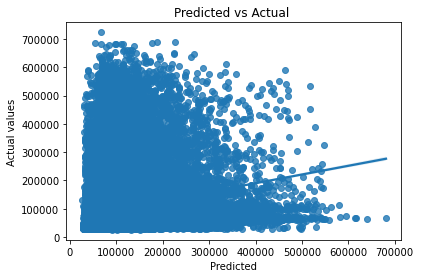

         cltv  Predicted  Residuals    Diff_in_%
88832   64080   64078.00       2.00     0.003121
87168   66960   66962.28      -2.28     0.003405
41736   64284   64281.72       2.28     0.003547
1436   149952  149946.00       6.00     0.004001
20085   56964   56961.24       2.76     0.004845
...       ...        ...        ...          ...
20308   31056  459864.00 -428808.00  1380.757342
19855   29352  435641.76 -406289.76  1384.197874
44784   32268  495303.36 -463035.36  1434.967646
88084   30108  494936.76 -464828.76  1543.871263
1189    28404  497793.72 -469389.72  1652.547951

[71513 rows x 4 columns]


In [121]:
xtrees_4 = ExtraTreesRegressor()

xtrees_model_4, metrics_table_4h = regression_model_4(xtrees_4)

In [122]:
metrics_table_4h.index=['ExtraTrees_experiment_4']
metrics_table_4h

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
ExtraTrees_experiment_4,59241.430899,9.904054e+09,99519.115676,-0.2054


In [123]:
metrics_table_4 = pd.concat([metrics_table_1,metrics_table_4a,metrics_table_4b,metrics_table_4d,metrics_table_4e,metrics_table_4f,
                           metrics_table_4g,metrics_table_4h],axis=0)
metrics_table_4

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Baseline_Model,57395.527758,8.220394e+09,90666.389083,0.000000
Decision_Tree_experiment_4,67916.363906,1.427629e+10,119483.414227,-0.739394
KNN_regression_experiment_4,55573.445433,8.313937e+09,91180.794257,-0.012012
Gradient_boost_regression_experiment_4,50480.651690,6.913875e+09,83149.711860,0.158904
XGBoost_Regression_experiment_4,51258.947767,7.120298e+09,84381.857011,0.133668
Random_forest_experiment_4,55452.171849,7.888888e+09,88819.411237,0.039168
Adaboost_experiment_4,76513.680247,9.071831e+09,95246.159039,-0.055923
ExtraTrees_experiment_4,59241.430899,9.904054e+09,99519.115676,-0.205400


## EXPERIMENT 5

In [186]:
train_5=train.copy()

xtrain_5 = train_5.drop(['cltv','id'],axis=1)
ytrain_5 = train_5['cltv']

func_transformer5 = PowerTransformer(method='yeo-johnson')


for i in xtrain_5.select_dtypes('number').columns:
    data=xtrain_5.copy()
    if 0 in train_5[i].unique():
        pass
    else:
        xtrain_5[i] = func_transformer5.transform(xtrain_5[i])

num = xtrain_5.select_dtypes('number')
cat = xtrain_5.select_dtypes('O')
    
num_attr=list(num)
cat_attr=list(cat)

# SCALING 
full_pipeline5=ColumnTransformer([('num',RobustScaler(),num_attr),
                                  ('cat',OneHotEncoder(),cat_attr),],
                                 verbose_feature_names_out=True)

df_pipe5=full_pipeline5.fit_transform(xtrain_5)
features = full_pipeline5.get_feature_names_out()

xtrain_5 = pd.DataFrame(df_pipe5, columns = features)


<AxesSubplot:xlabel='num__claim_amount', ylabel='Density'>

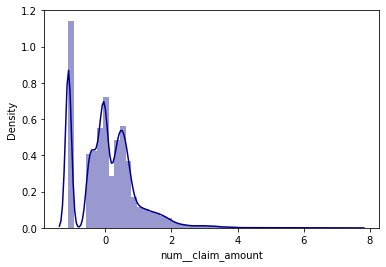

In [187]:
sns.distplot(xtrain_5['num__claim_amount'],kde=True,color='darkblue')

In [126]:
#FEATURE SELECTION
from sklearn.feature_selection import SelectKBest

kbest = SelectKBest(score_func=f_regression, k=15)
fit=kbest.fit(xtrain_5, ytrain_5)

scores=fit.scores_
scores

array([5.43568752e+02, 3.79808286e+01, 3.00505254e+03, 1.55211940e-01,
       1.55211940e-01, 1.61234035e+03, 1.61234035e+03, 2.71542346e+00,
       1.58852122e+01, 1.97038155e+02, 4.49836716e+02, 1.30970697e+02,
       4.19884722e+01, 1.42389087e+02, 1.33450722e+04, 1.33450722e+04,
       1.10774573e+02, 3.04455552e+02, 8.94237223e+01, 6.65336084e+00,
       4.05555536e+01, 1.01132004e+02])

In [127]:
features = np.array(xtrain_5.columns)

In [128]:
filter = kbest.get_support()
features[filter]

array(['num__marital_status', 'num__claim_amount', 'cat__area_Rural',
       'cat__area_Urban', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income_<=2L',
       'cat__income_More than 10L', 'cat__num_policies_1',
       'cat__num_policies_More than 1', 'cat__policy_A', 'cat__policy_B',
       'cat__policy_C', 'cat__type_of_policy_Silver'], dtype=object)

In [129]:
xtrain_5 = xtrain_5[['num__marital_status', 'num__claim_amount', 'cat__area_Rural',
       'cat__area_Urban', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income_<=2L',
       'cat__income_More than 10L', 'cat__num_policies_1',
       'cat__num_policies_More than 1', 'cat__policy_A', 'cat__policy_B',
       'cat__policy_C', 'cat__type_of_policy_Silver']]

In [183]:
def regression_model_5(model):
    model.fit(xtrain_5,ytrain_5)

    regex = re.compile(r"\[|\]|<", re.IGNORECASE)

    xtrain_5.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in xtrain_5.columns.values]

    
    train_pred = cross_val_predict(model, xtrain_5, ytrain_5, cv=10)
    mse_score=abs(cross_val_score(model,xtrain_5,ytrain_5,scoring='neg_mean_squared_error',cv=10).mean())
    mae_score=abs(cross_val_score(model,xtrain_5,ytrain_5,scoring='neg_mean_absolute_error',cv=10).mean())
    r2score=cross_val_score(model,xtrain_5,ytrain_5,scoring='r2',cv=10).mean()
    
    rmse = np.sqrt(mse_score)
    
    normalised_rmse=rmse/(ytrain_5.max()- ytrain_5.min())
    
    
    n=xtrain_5.shape[0]
    p=xtrain_5.shape[1]
    adjusted_r2 = 1 - (1-r2score) *(n-1)/(n-p-1)
    
    
    
    
   
    print('Train_Mean_absolute_error','---',mae_score)
    print('Train_R2_score','---',r2score)
    print('Train_Mean_squared_error','---',mse_score)
    print('Train_Root_mean_squared_error','---',rmse)

    print('Train_Adjusted_r2','---',adjusted_r2)
    print('Train_Normalised_rmse','---',normalised_rmse)
    print()
    print()
    
    
    sns.regplot(x=train_pred,y=ytrain_5)
    plt.title('Predicted vs Actual ')
    plt.xlabel('Predicted')
    plt.ylabel('Actual values')
    plt.show();
    
    stat=pd.DataFrame(ytrain_5)
    
    stat['Predicted']=train_pred
    
    stat['Residuals']=stat.iloc[:,0] - stat['Predicted']

    stat['Diff_in_%']=abs((stat['Residuals']/stat.iloc[:,0])*100)



    #to view all data
    pd.options.display.max_rows=1000
    stat= stat.sort_values(by='Diff_in_%')
    print(stat)
    
    metrics_table_5= pd.DataFrame({'Mean_absolute_error':mae_score,
                                    'Mean_squared_error':mse_score,
                                    'Root_mean_squared_error':rmse,
                                    'R2_score':r2score},index=[0])



    
    return model,metrics_table_5


## DECISION TREE

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 64278.55204830693
Train_R2_score --- -0.5650993811006749
Train_Mean_squared_error --- 12826650275.37597
Train_Root_mean_squared_error --- 113254.80243846602
Train_Adjusted_r2 --- -0.5653620521837008
Train_Normalised_rmse --- 0.16196842634641329




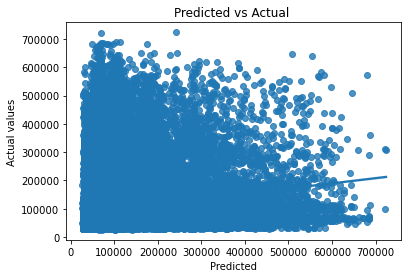

        cltv  Predicted  Residuals    Diff_in_%
78510  63456    63456.0        0.0     0.000000
74151  69576    69576.0        0.0     0.000000
79794  35004    35004.0        0.0     0.000000
27205  30840    30840.0        0.0     0.000000
44485  67116    67116.0        0.0     0.000000
...      ...        ...        ...          ...
70253  31284   545856.0  -514572.0  1644.840813
52215  30912   558060.0  -527148.0  1705.318323
74320  31392   569472.0  -538080.0  1714.067278
58026  31320   583116.0  -551796.0  1761.800766
22921  29184   544212.0  -515028.0  1764.761513

[89392 rows x 4 columns]


In [131]:
tree_5 = DecisionTreeRegressor()

tree_model_5,metrics_table_5a= regression_model_5(tree_5)

In [132]:
metrics_table_5a.index = ['Decision_Tree_experiment_5']
metrics_table_5a

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Decision_Tree_experiment_5,64278.552048,1.282665e+10,113254.802438,-0.565099


## KNN

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 55589.68752805254
Train_R2_score --- -0.004373051943375084
Train_Mean_squared_error --- 8242718813.316103
Train_Root_mean_squared_error --- 90789.42016180136
Train_Adjusted_r2 --- -0.004541616163961759
Train_Normalised_rmse --- 0.1298401409556109




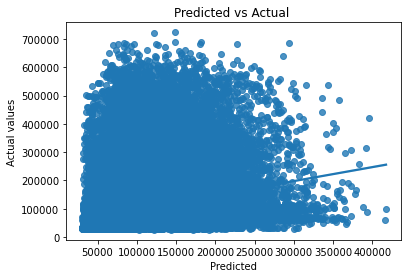

         cltv  Predicted  Residuals   Diff_in_%
7964   108420   108420.0        0.0    0.000000
87533  100596   100596.0        0.0    0.000000
11832   64428    64430.4       -2.4    0.003725
52133  102336   102331.2        4.8    0.004690
72939   38364    38366.4       -2.4    0.006256
...       ...        ...        ...         ...
74320   31392   287076.0  -255684.0  814.487768
44905   30216   286219.2  -256003.2  847.243844
21893   31332   302438.4  -271106.4  865.270011
33802   31536   305128.8  -273592.8  867.557078
11917   29064   300115.2  -271051.2  932.601156

[89392 rows x 4 columns]


In [133]:
knn = KNeighborsRegressor()

knn_model_5,metrics_table_5b = regression_model_5(knn)

In [134]:
metrics_table_5b.index=['KNN_regression_experiment_5']
metrics_table_5b

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
KNN_regression_experiment_5,55589.687528,8.242719e+09,90789.420162,-0.004373


## GRADIENT BOOSTING

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 50519.896313460136
Train_R2_score --- 0.15974621132334552
Train_Mean_squared_error --- 6898005099.599058
Train_Root_mean_squared_error --- 83054.2298718076
Train_Adjusted_r2 --- 0.15960519128630934
Train_Normalised_rmse --- 0.11877785863481438




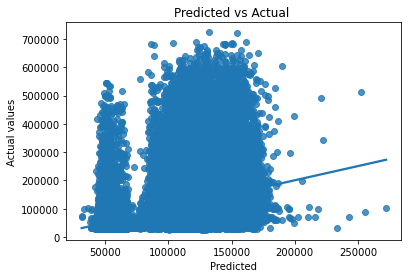

        cltv      Predicted      Residuals   Diff_in_%
24112  45228   45228.050870      -0.050870    0.000112
38078  53688   53690.339652      -2.339652    0.004358
4329   50700   50702.378099      -2.378099    0.004691
52759  53292   53295.785961      -3.785961    0.007104
58615  51636   51631.671514       4.328486    0.008383
...      ...            ...            ...         ...
39073  29604  167840.094727 -138236.094727  466.950732
7577   28824  167616.948111 -138792.948111  481.518693
62526  29172  170049.203512 -140877.203512  482.919250
28050  30180  180373.935697 -150193.935697  497.660489
68972  33300  233333.176799 -200033.176799  600.700231

[89392 rows x 4 columns]


In [135]:
gradient = GradientBoostingRegressor()

grad_5,metrics_table_5d = regression_model_5(gradient)

In [136]:
metrics_table_5d.index = ['Gradient_boost_regression_experiment_5']
metrics_table_5d


,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boost_regression_experiment_5,50519.896313,6.898005e+09,83054.229872,0.159746


## XGBOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51065.663737695475
Train_R2_score --- 0.14118223272831942
Train_Mean_squared_error --- 7049836583.420209
Train_Root_mean_squared_error --- 83963.30498152279
Train_Adjusted_r2 --- 0.1410380970933719
Train_Normalised_rmse --- 0.1200779488895412




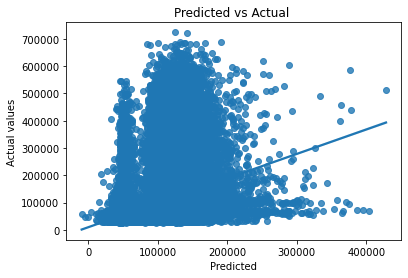

         cltv      Predicted      Residuals   Diff_in_%
32019   49584   49584.128906      -0.128906    0.000260
66837   62736   62735.390625       0.609375    0.000971
71278  110016  110017.117188      -1.117188    0.001015
66164  117324  117325.382812      -1.382812    0.001179
2207    50784   50785.710938      -1.710938    0.003369
...       ...            ...            ...         ...
58973   30480  212522.093750 -182042.093750  597.250977
22543   29556  213250.734375 -183694.734375  621.514160
77759   33300  240363.156250 -207063.156250  621.811279
15278   32292  235849.375000 -203557.375000  630.364685
22700   32736  257513.140625 -224777.140625  686.635925

[89392 rows x 4 columns]


In [137]:
xgb_=xgb.XGBRegressor()


xgb_model_5,metrics_table_5e = regression_model_5(xgb_)

In [138]:
metrics_table_5e.index=['XGBoost_Regression_experiment_5']
metrics_table_5e

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
XGBoost_Regression_experiment_5,51065.663738,7.049837e+09,83963.304982,0.141182


## RANDOM FOREST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 56438.468965571476
Train_R2_score --- -0.07717889426057847
Train_Mean_squared_error --- 8854345701.00674
Train_Root_mean_squared_error --- 94097.53291668565
Train_Adjusted_r2 --- -0.07735967750679551
Train_Normalised_rmse --- 0.1345711528469276




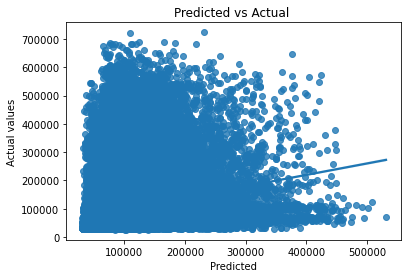

         cltv      Predicted      Residuals    Diff_in_%
75115   33648   33649.120000      -1.120000     0.003329
54572   44868   44869.680000      -1.680000     0.003744
18016  108144  108149.679009      -5.679009     0.005251
63491   34500   34502.040000      -2.040000     0.005913
39274   97824   97816.756000       7.244000     0.007405
...       ...            ...            ...          ...
7335    33192  358304.640000 -325112.640000   979.490962
79055   31200  357864.705000 -326664.705000  1047.002260
87369   30168  366755.825810 -336587.825810  1115.711435
86747   31848  389420.952000 -357572.952000  1122.748531
57956   27972  345865.152286 -317893.152286  1136.469156

[89392 rows x 4 columns]


In [139]:
forest=RandomForestRegressor()

forest_model_5,metrics_table_5f = regression_model_5(forest)

In [140]:
metrics_table_5f.index=['Random_forest_experiment_5']
metrics_table_5f

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Random_forest_experiment_5,56438.468966,8.854346e+09,94097.532917,-0.077179


## ADABOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 76286.29165806668
Train_R2_score --- -0.21523380760016422
Train_Mean_squared_error --- 10312835391.244375
Train_Root_mean_squared_error --- 101552.13139685633
Train_Adjusted_r2 --- -0.21543776064252462
Train_Normalised_rmse --- 0.14523215404847598




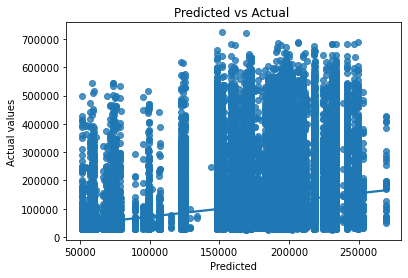

         cltv      Predicted      Residuals   Diff_in_%
72924   59916   59915.742342       0.257658    0.000430
82691  171588  171591.853769      -3.853769    0.002246
12542   56952   56949.473926       2.526074    0.004435
83899  151968  151978.585629     -10.585629    0.006966
66211   54240   54244.534615      -4.534615    0.008360
...       ...            ...            ...         ...
18386   29292  249840.381052 -220548.381052  752.930428
21019   29124  249840.381052 -220716.381052  757.850505
54019   27972  241839.419076 -213867.419076  764.576788
22780   28752  249840.381052 -221088.381052  768.949572
73262   25848  230887.639773 -205039.639773  793.251469

[89392 rows x 4 columns]


In [141]:
adaboost=AdaBoostRegressor()

adaboost_model_5,metrics_table_5g = regression_model_5(adaboost)

In [142]:
metrics_table_5g.index=['Adaboost_experiment_5']
metrics_table_5g

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Adaboost_experiment_5,76286.291658,1.031284e+10,101552.131397,-0.215234


## EXTRA TREES

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 60463.68899270578
Train_R2_score --- -0.3314547046283088
Train_Mean_squared_error --- 10921694295.800886
Train_Root_mean_squared_error --- 104506.91027774617
Train_Adjusted_r2 --- -0.33167816305752273
Train_Normalised_rmse --- 0.1494578546389597




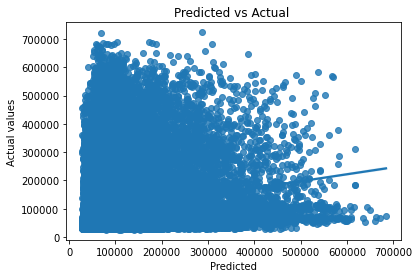

        cltv  Predicted  Residuals    Diff_in_%
26766  63168   63168.00       0.00     0.000000
46463  34092   34092.00       0.00     0.000000
79155  63168   63168.00       0.00     0.000000
72869  36852   36851.28       0.72     0.001954
76400  61980   61978.68       1.32     0.002130
...      ...        ...        ...          ...
11917  29064  434667.84 -405603.84  1395.554088
41242  31668  479368.20 -447700.20  1413.730580
87369  30168  458952.00 -428784.00  1421.320605
27447  31344  491011.68 -459667.68  1466.525268
57956  27972  454680.00 -426708.00  1525.482625

[89392 rows x 4 columns]


In [143]:
xtrees_5 = ExtraTreesRegressor()

xtrees_model_5, metrics_table_5h = regression_model_5(xtrees_5)

In [144]:
metrics_table_5h.index=['ExtraTrees_experiment_5']
metrics_table_5h

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
ExtraTrees_experiment_5,60463.688993,1.092169e+10,104506.910278,-0.331455


In [145]:
metrics_table_5 = pd.concat([metrics_table_1,metrics_table_5a,metrics_table_5b,metrics_table_5d,metrics_table_5e,metrics_table_5f,
                           metrics_table_5g,metrics_table_5h],axis=0)
metrics_table_5

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Baseline_Model,57395.527758,8.220394e+09,90666.389083,0.000000
Decision_Tree_experiment_5,64278.552048,1.282665e+10,113254.802438,-0.565099
KNN_regression_experiment_5,55589.687528,8.242719e+09,90789.420162,-0.004373
Gradient_boost_regression_experiment_5,50519.896313,6.898005e+09,83054.229872,0.159746
XGBoost_Regression_experiment_5,51065.663738,7.049837e+09,83963.304982,0.141182
Random_forest_experiment_5,56438.468966,8.854346e+09,94097.532917,-0.077179
Adaboost_experiment_5,76286.291658,1.031284e+10,101552.131397,-0.215234
ExtraTrees_experiment_5,60463.688993,1.092169e+10,104506.910278,-0.331455


## EXPERIMENT 6
- Transformation
- Encoding

In [169]:
train_6=train.copy()

xtrain_6 = train_6.drop(['cltv','id'],axis=1)
ytrain_6 = train_6['cltv']

func_transformer_6 = FunctionTransformer(np.log)

for i in xtrain_6.select_dtypes('number').columns:
    data=xtrain_6.copy()
    if 0 in train_6[i].unique():
        pass
    else:
        xtrain_6[i] = func_transformer_6.transform(xtrain_6[i])

num = xtrain_6.select_dtypes('number')
cat = xtrain_6.select_dtypes('O')
    
num_attr=list(num)
cat_attr=list(cat)

# SCALING 
full_pipeline6=ColumnTransformer([('cat',OneHotEncoder(),cat_attr),],verbose_feature_names_out=True)

df_pipe6=full_pipeline6.fit_transform(xtrain_6)
features = full_pipeline6.get_feature_names_out()

xtrain_6 = pd.DataFrame(df_pipe6, columns = features)


In [176]:
def regression_model_6(model):
    model.fit(xtrain_6,ytrain_6)

    regex = re.compile(r"\[|\]|<", re.IGNORECASE)

    xtrain_6.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in xtrain_6.columns.values]

    
    train_pred = cross_val_predict(model, xtrain_6, ytrain_6, cv=10)
    mse_score=abs(cross_val_score(model,xtrain_6,ytrain_6,scoring='neg_mean_squared_error',cv=10).mean())
    mae_score=abs(cross_val_score(model,xtrain_6,ytrain_6,scoring='neg_mean_absolute_error',cv=10).mean())
    r2score=cross_val_score(model,xtrain_6,ytrain_6,cv=10,scoring='r2').mean()
    
    rmse = np.sqrt(mse_score)
    
    normalised_rmse=rmse/(ytrain_6.max()- ytrain_6.min())
    
    
    n=xtrain_6.shape[0]
    p=xtrain_6.shape[1]
    adjusted_r2 = 1 - (1-r2score) *(n-1)/(n-p-1)
    
    
    
    
   
    print('Train_Mean_absolute_error','---',mae_score)
    print('Train_R2_score','---',r2score)
    print('Train_Mean_squared_error','---',mse_score)
    print('Train_Root_mean_squared_error','---',rmse)

    print('Train_Adjusted_r2','---',adjusted_r2)
    print('Train_Normalised_rmse','---',normalised_rmse)
    print()
    print()
    
    
    sns.regplot(x=train_pred,y=ytrain_6)
    plt.title('Predicted vs Actual ')
    plt.xlabel('Predicted')
    plt.ylabel('Actual values')
    plt.show();
    
    stat=pd.DataFrame(ytrain_6)
    
    stat['Predicted']=train_pred
    
    stat['Residuals']=stat.iloc[:,0] - stat['Predicted']

    stat['Diff_in_%']=abs((stat['Residuals']/stat.iloc[:,0])*100)



    #to view all data
    pd.options.display.max_rows=1000
    stat= stat.sort_values(by='Diff_in_%')
    print(stat)
    
    metrics_table_6= pd.DataFrame({'Mean_absolute_error':mae_score,
                                    'Mean_squared_error':mse_score,
                                    'Root_mean_squared_error':rmse,
                                    'R2_score':r2score},index=[0])



    
    return model,metrics_table_6


## DECISION TREE

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51238.93107109533
Train_R2_score --- 0.1432053886411563
Train_Mean_squared_error --- 7033843993.556539
Train_Root_mean_squared_error --- 83868.0153190508
Train_Adjusted_r2 --- 0.14302323877748746
Train_Normalised_rmse --- 0.11994167284344545




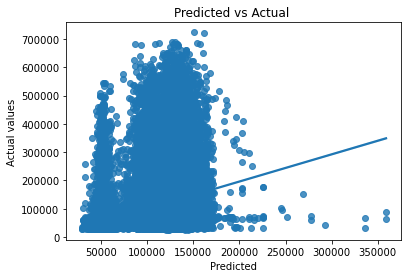

         cltv      Predicted      Residuals   Diff_in_%
13784  110664  110663.558824       0.441176    0.000399
52840   51264   51263.536585       0.463415    0.000904
8108    44304   44304.750000      -0.750000    0.001693
51322   50736   50734.394780       1.605220    0.003164
11846   55644   55647.633466      -3.633466    0.006530
...       ...            ...            ...         ...
77419   32964  212940.000000 -179976.000000  545.977430
46893   30468  200496.000000 -170028.000000  558.054352
30503   43656  292776.000000 -249120.000000  570.643211
17818   32892  226032.705882 -193140.705882  587.196601
47203   31680  336096.000000 -304416.000000  960.909091

[89392 rows x 4 columns]


In [171]:
tree_6 = DecisionTreeRegressor()

tree_model_6,metrics_table_6a= regression_model_6(tree_6)

In [149]:
metrics_table_6a.index = ['Decision_Tree_experiment_6']
metrics_table_6a

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Decision_Tree_experiment_6,51238.881546,7.033821e+09,83867.87867,0.143205


## KNN

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 56339.09599732115
Train_R2_score --- -0.011894156266121336
Train_Mean_squared_error --- 8306321268.773283
Train_Root_mean_squared_error --- 91139.02165797746
Train_Adjusted_r2 --- -0.01210927944753215
Train_Normalised_rmse --- 0.13034011449284574




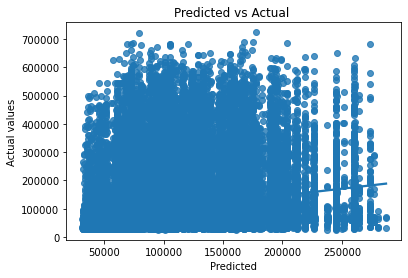

         cltv  Predicted  Residuals   Diff_in_%
69369   39408    39405.6        2.4    0.006090
77035   36384    36386.4       -2.4    0.006596
57841   35064    35061.6        2.4    0.006845
50302   34956    34953.6        2.4    0.006866
15941  101448   101440.8        7.2    0.007097
...       ...        ...        ...         ...
17818   32892   287131.2  -254239.2  772.951478
22543   29556   259932.0  -230376.0  779.455948
19081   29028   259932.0  -230904.0  795.452666
28205   25284   237343.2  -212059.2  838.709065
37308   24828   244821.6  -219993.6  886.070565

[89392 rows x 4 columns]


In [150]:
knn = KNeighborsRegressor()

knn_model_6,metrics_table_6b = regression_model_6(knn)

In [151]:
metrics_table_6b.index=['KNN_regression_experiment_6']
metrics_table_6b

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
KNN_regression_experiment_6,56339.095997,8.306321e+09,91139.021658,-0.011894


## GRADIENT BOOSTING

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51047.056570174755
Train_R2_score --- 0.14856732019749708
Train_Mean_squared_error --- 6989908166.618713
Train_Root_mean_squared_error --- 83605.67066065982
Train_Adjusted_r2 --- 0.14838631025124716
Train_Normalised_rmse --- 0.11956648741585123




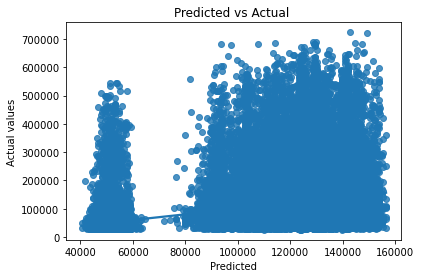

        cltv      Predicted      Residuals   Diff_in_%
84606  55008   55008.009297      -0.009297    0.000017
76473  48960   48959.187349       0.812651    0.001660
44946  50244   50244.960269      -0.960269    0.001911
5827   50868   50865.165068       2.834932    0.005573
74045  47616   47613.160333       2.839667    0.005964
...      ...            ...            ...         ...
73366  29124  149932.165905 -120808.165905  414.806228
89026  28524  147795.768416 -119271.768416  418.145311
51027  27036  140335.462103 -113299.462103  419.068879
5579   29376  152486.131697 -123110.131697  419.084054
73262  25848  139533.348657 -113685.348657  439.822612

[89392 rows x 4 columns]


In [152]:
gradient = GradientBoostingRegressor()

grad_6,metrics_table_6d = regression_model_6(gradient)

In [153]:
metrics_table_6d.index = ['Gradient_boost_regression_experiment_6']
metrics_table_6d

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boost_regression_experiment_6,51047.05657,6.989908e+09,83605.670661,0.148567


## XGBOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51210.67613982239
Train_R2_score --- 0.14422419904906764
Train_Mean_squared_error --- 7025433996.368086
Train_Root_mean_squared_error --- 83817.86203649009
Train_Adjusted_r2 --- 0.14404226577893753
Train_Normalised_rmse --- 0.11986994742361719




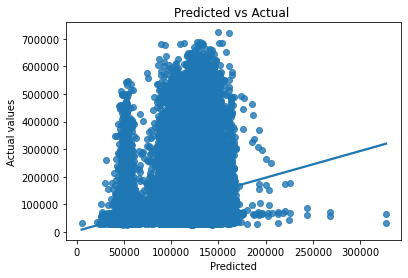

         cltv      Predicted      Residuals   Diff_in_%
59860   99984   99984.476562      -0.476562    0.000477
78958  130416  130411.195312       4.804688    0.003684
64564  106620  106614.929688       5.070312    0.004755
48290   55884   55880.835938       3.164062    0.005662
13796   50964   50967.199219      -3.199219    0.006277
...       ...            ...            ...         ...
28205   25284  143669.984375 -118385.984375  468.224915
44435   30456  180513.921875 -150057.921875  492.703949
46893   30468  190709.531250 -160241.531250  525.933899
17818   32892  213464.296875 -180572.296875  548.985474
47203   31680  327253.375000 -295573.375000  932.996765

[89392 rows x 4 columns]


In [154]:
xgb_=xgb.XGBRegressor()


xgb_model_6,metrics_table_6e = regression_model_6(xgb_)

In [155]:
metrics_table_6e.index=['XGBoost_Regression_experiment_6']
metrics_table_6e

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
XGBoost_Regression_experiment_6,51210.67614,7.025434e+09,83817.862036,0.144224


## RANDOM  FOREST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51241.53601929701
Train_R2_score --- 0.14334825787393754
Train_Mean_squared_error --- 7032313628.207939
Train_Root_mean_squared_error --- 83858.89116967825
Train_Adjusted_r2 --- 0.1431661383834888
Train_Normalised_rmse --- 0.11992862417721847




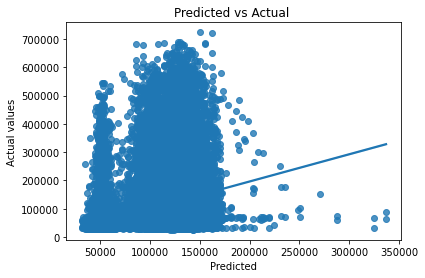

         cltv      Predicted      Residuals   Diff_in_%
16581  103416  103414.119210       1.880790    0.001819
78021   48744   48745.784972      -1.784972    0.003662
59860   99984   99979.961899       4.038101    0.004039
17239  111072  111077.525797      -5.525797    0.004975
27081   50856   50853.427239       2.572761    0.005059
...       ...            ...            ...         ...
53562   34464  200632.245793 -166168.245793  482.150203
15700   32040  192332.687524 -160292.687524  500.289287
17818   32892  219976.062388 -187084.062388  568.782872
46893   30468  204910.048044 -174442.048044  572.541841
47203   31680  324811.040000 -293131.040000  925.287374

[89392 rows x 4 columns]


In [156]:
forest=RandomForestRegressor()

forest_model_6,metrics_table_6f = regression_model_6(forest)

In [157]:
metrics_table_6f.index=['Random_forest_experiment_6']
metrics_table_6f

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Random_forest_experiment_6,51241.536019,7.032314e+09,83858.89117,0.143348


## ADABOOST

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 66716.50096250388
Train_R2_score --- 0.01141466403616348
Train_Mean_squared_error --- 8104445068.858172
Train_Root_mean_squared_error --- 90024.6914399498
Train_Adjusted_r2 --- 0.011204496182883661
Train_Normalised_rmse --- 0.12874648395393543




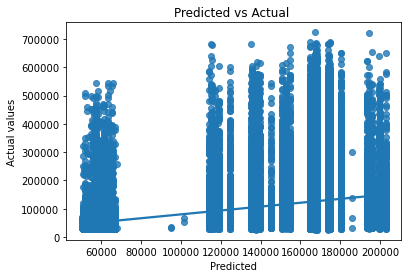

         cltv      Predicted      Residuals   Diff_in_%
33823   63432   63433.212952      -1.212952    0.001912
32500   63432   63433.212952      -1.212952    0.001912
49367   53556   53558.349560      -2.349560    0.004387
17949  115860  115868.347541      -8.347541    0.007205
9411   174888  174872.755155      15.244845    0.008717
...       ...            ...            ...         ...
37308   24828  168353.361221 -143525.361221  578.078626
5579    29376  202860.057197 -173484.057197  590.563920
27294   28764  199925.146960 -171161.146960  595.053355
89026   28524  199326.045696 -170802.045696  598.801170
7577    28824  202860.057197 -174036.057197  603.788708

[89392 rows x 4 columns]


In [158]:
adaboost=AdaBoostRegressor()

adaboost_model_6,metrics_table_6g = regression_model_6(adaboost)

In [159]:
metrics_table_6g.index=['Adaboost_experiment_6']
metrics_table_6g

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Adaboost_experiment_6,66716.500963,8.104445e+09,90024.69144,0.011415


## EXTRA TREES

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Train_Mean_absolute_error --- 51238.86620791193
Train_R2_score --- 0.14320465143168018
Train_Mean_squared_error --- 7033832325.222296
Train_Root_mean_squared_error --- 83867.94575534979
Train_Adjusted_r2 --- 0.14302250141128448
Train_Normalised_rmse --- 0.11994157335871775




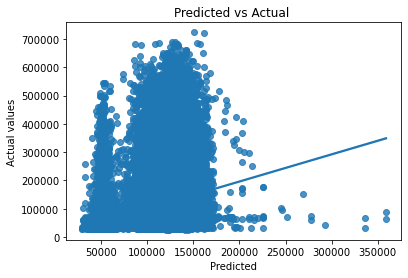

         cltv      Predicted      Residuals   Diff_in_%
13784  110664  110663.558824       0.441176    0.000399
52840   51264   51263.536585       0.463415    0.000904
8108    44304   44304.750000      -0.750000    0.001693
51322   50736   50734.394780       1.605220    0.003164
11846   55644   55647.633466      -3.633466    0.006530
...       ...            ...            ...         ...
77419   32964  212940.000000 -179976.000000  545.977430
46893   30468  200496.000000 -170028.000000  558.054352
30503   43656  292776.000000 -249120.000000  570.643211
17818   32892  226032.705882 -193140.705882  587.196601
47203   31680  336096.000000 -304416.000000  960.909091

[89392 rows x 4 columns]


In [160]:
xtrees_6 = ExtraTreesRegressor()

xtrees_model_6, metrics_table_6h = regression_model_6(xtrees_6)

In [161]:
metrics_table_6h.index=['ExtraTrees_experiment_6']
metrics_table_6h

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
ExtraTrees_experiment_6,51238.866208,7.033832e+09,83867.945755,0.143205


In [163]:
metrics_table_6 = pd.concat([metrics_table_1,metrics_table_6a,metrics_table_6b,metrics_table_6d,metrics_table_6e,metrics_table_6f,
                           metrics_table_6g,metrics_table_6h],axis=0)
metrics_table_6

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Baseline_Model,57395.527758,8.220394e+09,90666.389083,0.000000
Decision_Tree_experiment_6,51238.881546,7.033821e+09,83867.878670,0.143205
KNN_regression_experiment_6,56339.095997,8.306321e+09,91139.021658,-0.011894
Gradient_boost_regression_experiment_6,51047.056570,6.989908e+09,83605.670661,0.148567
XGBoost_Regression_experiment_6,51210.676140,7.025434e+09,83817.862036,0.144224
Random_forest_experiment_6,51241.536019,7.032314e+09,83858.891170,0.143348
Adaboost_experiment_6,66716.500963,8.104445e+09,90024.691440,0.011415
ExtraTrees_experiment_6,51238.866208,7.033832e+09,83867.945755,0.143205


## PERFORMING HYPERPARAMETER TUNING ON THE BEST THREE MODELS
- Gradient_boost_regression_experiment_6
- Gradient_boost_regression_experiment_5
- XGBoost_Regression_experiment_6

In [164]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

## XGBoost_Regression_experiment_6

Fitting 5 folds for each of 5 candidates, totalling 25 fits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates

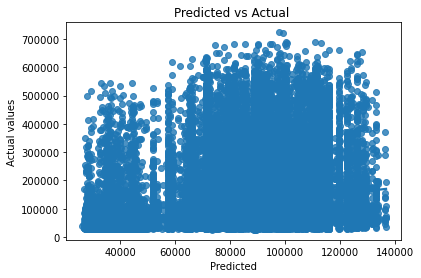

         cltv      Predicted     Residuals   Diff_in_%
39918   34092   34092.003906     -0.003906    0.000011
45184  105060  105060.234375     -0.234375    0.000223
57397   99936   99937.085938     -1.085938    0.001087
44442   34584   34584.667969     -0.667969    0.001931
78058   32892   32892.718750     -0.718750    0.002185
...       ...            ...           ...         ...
64267   27804  116219.617188 -88415.617188  317.996033
65951   30132  126439.367188 -96307.367188  319.618256
48119   29484  124011.656250 -94527.656250  320.606628
45087   27888  122607.742188 -94719.742188  339.643372
51027   27036  122607.742188 -95571.742188  353.498077

[89392 rows x 4 columns]


In [177]:
#RANDOMIZED SEARCH CV HYPERPARAMETER TUNING
params={"max_depth":    [2,3,4,5,6,7,8],
              "n_estimators": [80,100,150,200,500],
              "learning_rate": [0.0001,0.001,0.01, 0.015]}


xgb_t=RandomizedSearchCV(xgb_,param_distributions=params,n_iter=5,scoring='neg_mean_absolute_error',n_jobs=-1,verbose=3)

xgb_tun,metrics_table_tuned_1= regression_model_6(xgb_t)

In [178]:
metrics_table_tuned_1.index = ['XGBoost_6_tuned']
metrics_table_tuned_1

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
XGBoost_6_tuned,46316.325441,7.535919e+09,86809.672394,0.04376


## Gradient_boost_regression_experiment_6 tuning

Fitting 5 folds for each of 5 candidates, totalling 25 fits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates

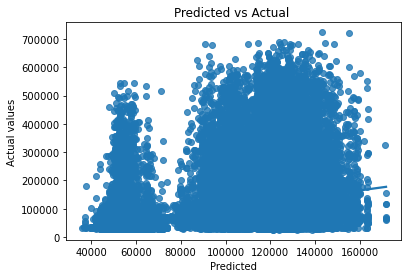

         cltv      Predicted      Residuals   Diff_in_%
66492   55596   55595.854648       0.145352    0.000261
56365   47292   47291.413344       0.586656    0.001240
17256   58968   58969.411961      -1.411961    0.002394
561    117288  117292.510364      -4.510364    0.003846
20076  103464  103469.907971      -5.907971    0.005710
...       ...            ...            ...         ...
28205   25284  132060.819095 -106776.819095  422.309837
54897   31032  163320.572593 -132288.572593  426.297282
58458   30984  163320.572593 -132336.572593  427.112615
73262   25848  138479.600644 -112631.600644  435.745902
89026   28524  154553.422904 -126029.422904  441.836429

[89392 rows x 4 columns]


In [179]:
#RANDOMIZED SEARCH CV HYPERPARAMETER TUNING
params={"max_depth":     range(5,16,2),
        "n_estimators":  range(20,81,10),
        "learning_rate": [0.0001,0.001,0.01, 0.015,0.05,0.1,0.15,0.2],
        'min_samples_leaf':range(30,71,10)
       
       
       }


gradient_t=RandomizedSearchCV(gradient,param_distributions=params,n_iter=5,scoring='neg_mean_absolute_error',n_jobs=-1,verbose=3)

gradient_tun,metrics_table_tuned_2= regression_model_6(gradient_t)

In [180]:
metrics_table_tuned_2.index = ['Gradient_boosting_6_tuned']
metrics_table_tuned_2

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boosting_6_tuned,51186.607411,7.027414e+09,83829.670747,0.146267


## Gradient_boost_regression_experiment_5 tuning

Fitting 5 folds for each of 5 candidates, totalling 25 fits


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Fitting 5 folds for each of 5 candidates

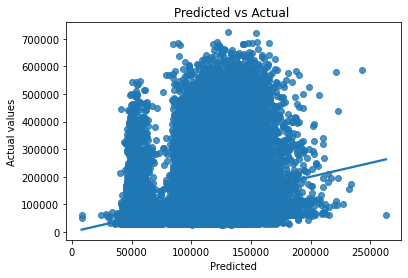

         cltv      Predicted      Residuals   Diff_in_%
87421  146832  146833.087538      -1.087538    0.000741
1366   174420  174414.923913       5.076087    0.002910
2000    58704   58701.897908       2.102092    0.003581
19459  110964  110969.410505      -5.410505    0.004876
13928  108756  108750.063479       5.936521    0.005459
...       ...            ...            ...         ...
33802   31536  176623.312588 -145087.312588  460.068850
27047   28992  163413.671054 -134421.671054  463.650907
39073   29604  168338.006722 -138734.006722  468.632640
22543   29556  171156.534752 -141600.534752  479.092349
28050   30180  181748.184077 -151568.184077  502.213996

[89392 rows x 4 columns]


In [184]:
#RANDOMIZED SEARCH CV HYPERPARAMETER TUNING
params={"max_depth":     range(5,16,2),
        "n_estimators":  range(20,81,10),
        "learning_rate": [0.0001,0.001,0.01, 0.015,0.05,0.1,0.15,0.2],
        'min_samples_leaf':range(30,71,10)
       
       
       }


gradient_a = RandomizedSearchCV(gradient,param_distributions=params,n_iter=5,scoring='neg_mean_absolute_error',n_jobs=-1,verbose=3)

gradient_tun_2,metrics_table_tuned_3 = regression_model_5(gradient_a)

In [185]:
metrics_table_tuned_3.index = ['Gradient_boosting_5_tuned']
metrics_table_tuned_3

,Mean_absolute_error,Mean_squared_error,Root_mean_squared_error,R2_score
Gradient_boosting_5_tuned,50567.337307,6.933762e+09,83269.216508,0.151486


## TESTING

In [193]:
test = X_test.copy()

xtest = test.drop(['cltv','id'],axis=1)
ytest = test['cltv']


for i in xtest.select_dtypes('number').columns:
    if 0 in xtest[i].unique():
        pass
    else:
        xtest[i] = func_transformer.transform(xtest[i])

df_pipe5=full_pipeline5.fit_transform(xtest)
features = full_pipeline5.get_feature_names_out()

xtest = pd.DataFrame(df_pipe5, columns = features)

In [194]:
xtest = xtest[['num__marital_status', 'num__claim_amount', 'cat__area_Rural',
       'cat__area_Urban', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income_<=2L',
       'cat__income_More than 10L', 'cat__num_policies_1',
       'cat__num_policies_More than 1', 'cat__policy_A', 'cat__policy_B',
       'cat__policy_C', 'cat__type_of_policy_Silver']]

In [195]:
regex = re.compile(r"\[|\]|<", re.IGNORECASE)

xtest.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in xtest.columns.values]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [196]:
test_pred = gradient_tun_2.predict(xtest)

In [200]:
r2_score(ytest, test_pred), np.sqrt(mean_squared_error(test_pred,ytest)), mean_absolute_error(test_pred,ytest)

(0.18025709099982723, 81847.02109028885, 49978.743103419176)

# OBSERVATIONS

- Data has 89392 samples and 12 features.
- There are no duplicates, empty strings/whitespaces or null values in dataset

**Univariate analysis:**
- Gender column is 56.4% Male and 43.6% Female
- Area column is 70% Urban and 30% rural
- Qualification of customers is 51.8% High School, 44% Bachelors, and 0.04% rural
- Income: 58.9% of customers earn between 5L to 10L annually, 23.7% earn between 2L and 5L,15.2% earn more than 10L, and 0.02% earn less than 2L annually
- Marital Status:  42.45% of customers are single and 57.5% are married.
- Number of policies:  32.6% of customers have only one policy active and 67.4% have more than 1 policy active
- Type of policy:  53.5% of customers are on the platinum policy, 23.5% are on the Silver policy, and 23% are on Gold

**Frequency of cardinality:**
- Qualification column: we notice that the value, Others, occurs in less than 5% of the dataset
- Income column: we notice that the value, less than 2L, occurs in less than 5% of the dataset

**Average customer lifetime value per value:**
- For Gender column, the average cltv for female is 97834, for male is 97698
- For Area column, the average cltv for urban is 105492, for rural is 79852
- For Qualification column, the average cltv for high school is 98750, for bachelors is 98414 and for others is 78457
- For Income column, the average cltv for 2L-5L is 109297, for 5L-10L is 94908, less than 2L is 109795, more than 10L is 89308
- For Policy column, the average cltv for A is 99952, for B is 89567, for C is 107260
- For Number of policies column, the average cltv for 1 policy is 50971, for more than 1 policy is 120493
- For Policy type column, the average cltv for Gold type is 99126, for Silver type is 91810, for platinum type is 99752

**Outliers:**
- We notice outliers present in CLTV and claim_amount columns so the robust scaling method and non-linear models will be used

**Distribution:**
- Vintage and marital status are multimodal
- CLTV and claim_amount are right-skewed

**Linearity and normality:**
- We notice no linear relationship with the target variable
- We notice no normality in our variables
Non-linear models will be used since our data doesnt meet the assumptions of a linear model<br>

**Experiment 1:** <br>
Here, we dont drop outliers and we transform data with a column transformer pipeline containing standard scaler to scale data and OneHotEncoder to encode categorical data.
- Decision Tree, extra trees and random forest have high R2 scorea and Low error scores. Overfitting?
- The decision tree model is tested and it is faring far worse than the train set.

**Experiment 2:**<br>
Building on the result from experiment 1, since we suspect some models are overfitting, we implement cross validation and feature selection with Lasso

**Experiment 3:**<br>
Building on experiment 2, we notice the models are underfitting so we trim outliers to see if model performance improves.

**Experiment 4:**<br>
The models are still underfitting so another method will be used to treat outliers-winsorization. Former methods like feature selection, robust scaling and cross validation will also be used

**Experiment 5:**<br>
Another feature selection method is used, Features are transformed by Yeo-Johnson transformation and categorical features are encoded with OneHOtEncoder. No significant improvement is noticed.

**Experiment 6:**<br>
Another feature selection method is used, Features are transformed by log transformation and categorical features are encoded with OneHotEncoder. Feature selection is done with Sklearn's SelectKBest and F_regression. No significant improvement is noticed.

**Hyperparameter Tuning** is performed on the best three models 

**Testing:** The final model is chosen from the three tuned models and is tested with the test data.

**Recommended:** Models aren't performing well, more features should be added to the data. A better way to deal with the outliers should be used






## TESTING WITH MAIN TEST DATA

In [208]:
test_data = pd.read_csv("/Users/USER/Documents/DATASETS/Customer_life_time_value/test_koRSKBP.csv")
main_test=test_data.drop(['id'],axis=1)
main_test.head()

,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy
0,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver
1,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum
2,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold
3,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver
4,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver


In [209]:
for i in main_test.select_dtypes('number').columns:
    if 0 in main_test[i].unique():
        pass
    else:
        main_test[i] = func_transformer.transform(main_test[i])

df_pipe5=full_pipeline5.fit_transform(main_test)
features = full_pipeline5.get_feature_names_out()

main_test = pd.DataFrame(df_pipe5, columns = features)

main_test = main_test[['num__marital_status', 'num__claim_amount', 'cat__area_Rural',
       'cat__area_Urban', 'cat__qualification_Others',
       'cat__income_2L-5L', 'cat__income_5L-10L', 'cat__income_<=2L',
       'cat__income_More than 10L', 'cat__num_policies_1',
       'cat__num_policies_More than 1', 'cat__policy_A', 'cat__policy_B',
       'cat__policy_C', 'cat__type_of_policy_Silver']]

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

main_test.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in main_test.columns.values]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [215]:
test_data['Predictions'] = pd.Series(gradient_tun_2.predict(main_test))

In [216]:
test_data.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,Predictions
0,89393,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver,98022.795226
1,89394,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum,121949.126629
2,89395,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold,99042.114095
3,89396,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver,86888.690533
4,89397,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver,123449.562110


In [217]:
Submission = test_data[['id','Predictions']]
Submission.head()

,id,Predictions
0,89393,98022.795226
1,89394,121949.126629
2,89395,99042.114095
3,89396,86888.690533
4,89397,123449.562110


In [218]:
Submission.to_csv("/Users/USER/Documents/DATASETS/Customer_life_time_value/Submission.csv")